In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
from sklearn.ensemble import IsolationForest
from scipy.stats import zscore
from sklearn.preprocessing import OrdinalEncoder
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN, Birch, AgglomerativeClustering
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score, make_scorer
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
import plotly.express as px
import plotly.io as pio
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import norm, anderson
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster
from sklearn.mixture import GaussianMixture

In [2]:
import warnings
warnings.filterwarnings('ignore')

In [3]:
df = pd.read_csv('mindfactory_updated.csv', sep=',')
df

,name,price_eur,display_inch,display_cm,display_resolution,display_ratio,weight_kg,height_mm,width_mm,depth_mm,...,keyboard_backlit,keyboard_numpad,has_webcam,has_bluetooth,bluetooth_version,wifi_standard,product_ean,product_sku,release_year,category
0,"Apple MacBook Air M1 256GB, Space grau",912.99,13.0,33.8,2560x1600,16:9,1.29,16.1,304.1,212.4,...,True,False,True,True,5.0,Wi-Fi 6 (802.11ax),1.942521e+11,MGN63D/A,2020.0,Notebooks
1,MSI Stealth 17 Studio A13VI-013 - Intel Core i...,4680.23,17.3,43.9,3840x2160,16:9,2.80,20.1,397.6,283.5,...,True,True,True,True,5.3,Wi-Fi 6E (802.11ax),4.711377e+12,0017P2-013,NaN,Notebooks
2,MSI Summit E14 FlipEvo A12MT-049 i7-1260P/16GB...,1651.12,14.0,35.6,2880x1800,NaN,1.60,17.9,314.0,227.5,...,True,False,True,True,5.2,Wi-Fi 6E (802.11ax),4.719073e+12,0014F1-049,NaN,Notebooks
3,Gigabyte GBT AORUS 15 9KF-E3DE383SH i5 W11 144Hz,1087.38,15.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,False,False,NaN,NaN,4.719332e+12,AORUS 15 9KF-E3DE383SH,NaN,Notebooks
4,Fujitsu Lifebook A3511 FHD i3-1115G4 8GB 256GB...,354.97,15.6,39.6,1920x1080,NaN,1.95,23.9,361.0,244.0,...,False,True,True,True,5.1,Wi-Fi 6E (802.11ax),4.065221e+12,FPC04902BS,NaN,Notebooks
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
759,Apple Macbook PRO 16 M2 PRO 12C/19C 16GB RAM 5...,2729.64,16.2,41.1,3456x2234,NaN,2.15,16.8,355.7,248.1,...,True,False,True,True,5.3,Wi-Fi 6E (802.11ax),1.942533e+11,MNW83D/A,2023.0,Notebooks
760,Apple MacBook Air Z15T Apple M2 8C CPU/10C GPU...,2182.57,13.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,False,False,NaN,NaN,4.066582e+12,MLXX3D/A-Z08762971,NaN,Notebooks
761,Microsoft Notebook Surface Laptop Go 2 - i5/ 4...,803.79,12.4,31.5,1536x1024,3:2,1.13,15.7,278.2,206.2,...,True,False,True,True,5.1,Wi-Fi 6 (802.11ax),8.898429e+11,L1D-00005,NaN,Notebooks
762,LG Electronics GRAM 16T90Q-G.AP79G i7 W11P FHD...,1447.97,16.0,40.6,2560x1600,16:10,1.48,16.9,356.6,248.3,...,True,True,True,True,5.1,Wi-Fi 6E (802.11ax),8.806092e+12,16T90Q-G.AP79G,NaN,Notebooks


In [4]:
df.describe(include='all')

,name,price_eur,display_inch,display_cm,display_resolution,display_ratio,weight_kg,height_mm,width_mm,depth_mm,...,keyboard_backlit,keyboard_numpad,has_webcam,has_bluetooth,bluetooth_version,wifi_standard,product_ean,product_sku,release_year,category
count,764,764.000000,763.000000,628.000000,628,454,616.000000,627.000000,627.000000,627.000000,...,764,764,764,764,540,627,6.980000e+02,764,126.000000,764
unique,760,NaN,NaN,NaN,22,3,NaN,NaN,NaN,NaN,...,2,2,2,2,8,3,NaN,764,NaN,1
top,Apple MacBook Pro M2 Max 32GB 1TB silber,NaN,NaN,NaN,1920x1080,16:10,NaN,NaN,NaN,NaN,...,True,False,True,True,5.1,Wi-Fi 6E (802.11ax),NaN,MGN63D/A,NaN,Notebooks
freq,2,NaN,NaN,NaN,238,206,NaN,NaN,NaN,NaN,...,542,540,608,626,281,332,NaN,1,NaN,764
mean,NaN,1736.678416,14.421232,37.355255,NaN,NaN,1.618625,21.511053,335.288357,228.200797,...,NaN,NaN,NaN,NaN,NaN,NaN,2.619275e+12,NaN,2022.039683,NaN
std,NaN,998.432706,2.102272,3.044616,NaN,NaN,0.467579,33.334493,27.438917,36.440450,...,NaN,NaN,NaN,NaN,NaN,NaN,2.476135e+12,NaN,0.773571,NaN
min,NaN,276.800000,0.000000,25.600000,NaN,NaN,0.400000,1.490000,278.200000,4.600000,...,NaN,NaN,NaN,NaN,NaN,NaN,1.942521e+11,NaN,2020.000000,NaN
25%,NaN,1037.910000,14.000000,35.600000,NaN,NaN,1.300000,14.700000,312.000000,217.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,1.968040e+11,NaN,2022.000000,NaN
50%,NaN,1530.730000,14.000000,35.600000,NaN,NaN,1.520000,17.900000,325.400000,226.900000,...,NaN,NaN,NaN,NaN,NaN,NaN,4.039407e+12,NaN,2022.000000,NaN
75%,NaN,2105.340000,15.600000,39.600000,NaN,NaN,1.802500,19.900000,359.000000,245.250000,...,NaN,NaN,NaN,NaN,NaN,NaN,4.711122e+12,NaN,2022.000000,NaN


In [5]:
df.duplicated().sum()

0

In [6]:
df.describe(include='all')

,name,price_eur,display_inch,display_cm,display_resolution,display_ratio,weight_kg,height_mm,width_mm,depth_mm,...,keyboard_backlit,keyboard_numpad,has_webcam,has_bluetooth,bluetooth_version,wifi_standard,product_ean,product_sku,release_year,category
count,764,764.000000,763.000000,628.000000,628,454,616.000000,627.000000,627.000000,627.000000,...,764,764,764,764,540,627,6.980000e+02,764,126.000000,764
unique,760,NaN,NaN,NaN,22,3,NaN,NaN,NaN,NaN,...,2,2,2,2,8,3,NaN,764,NaN,1
top,Apple MacBook Pro M2 Max 32GB 1TB silber,NaN,NaN,NaN,1920x1080,16:10,NaN,NaN,NaN,NaN,...,True,False,True,True,5.1,Wi-Fi 6E (802.11ax),NaN,MGN63D/A,NaN,Notebooks
freq,2,NaN,NaN,NaN,238,206,NaN,NaN,NaN,NaN,...,542,540,608,626,281,332,NaN,1,NaN,764
mean,NaN,1736.678416,14.421232,37.355255,NaN,NaN,1.618625,21.511053,335.288357,228.200797,...,NaN,NaN,NaN,NaN,NaN,NaN,2.619275e+12,NaN,2022.039683,NaN
std,NaN,998.432706,2.102272,3.044616,NaN,NaN,0.467579,33.334493,27.438917,36.440450,...,NaN,NaN,NaN,NaN,NaN,NaN,2.476135e+12,NaN,0.773571,NaN
min,NaN,276.800000,0.000000,25.600000,NaN,NaN,0.400000,1.490000,278.200000,4.600000,...,NaN,NaN,NaN,NaN,NaN,NaN,1.942521e+11,NaN,2020.000000,NaN
25%,NaN,1037.910000,14.000000,35.600000,NaN,NaN,1.300000,14.700000,312.000000,217.000000,...,NaN,NaN,NaN,NaN,NaN,NaN,1.968040e+11,NaN,2022.000000,NaN
50%,NaN,1530.730000,14.000000,35.600000,NaN,NaN,1.520000,17.900000,325.400000,226.900000,...,NaN,NaN,NaN,NaN,NaN,NaN,4.039407e+12,NaN,2022.000000,NaN
75%,NaN,2105.340000,15.600000,39.600000,NaN,NaN,1.802500,19.900000,359.000000,245.250000,...,NaN,NaN,NaN,NaN,NaN,NaN,4.711122e+12,NaN,2022.000000,NaN


In [7]:
print(df.isnull().sum())

name                     0
price_eur                0
display_inch             1
display_cm             136
display_resolution     136
display_ratio          310
weight_kg              148
height_mm              137
width_mm               137
depth_mm               137
operating_system       138
cpu_processor          136
ram_memory             137
gpu_integrated         147
gpu_extra              633
internal_storage_gb    146
storage_type           137
battery_life_h         554
battery_capacity_wh    184
psu_watts              188
audio_system           425
speakers_count         226
has_touchscreen          0
keyboard_backlit         0
keyboard_numpad          0
has_webcam               0
has_bluetooth            0
bluetooth_version      224
wifi_standard          137
product_ean             66
product_sku              0
release_year           638
category                 0
dtype: int64


In [8]:
def plot_distribution_categorical(df):   
    categorical_features = df.select_dtypes(include=[np.object_, 'category']).columns
    cat_features = len(categorical_features)
    cat_cols = 2
    cat_rows = (cat_features + cat_cols - 1) // cat_cols

    fig, axs = plt.subplots(cat_rows, cat_cols, figsize=(20, 20), constrained_layout=True)

    axs = axs.flatten()

    for i, col in enumerate(categorical_features):
        sns.countplot(y=col, data=df, ax=axs[i], order=df[col].value_counts().index, palette='viridis')
        axs[i].set_title(f'Distribution of {col}')
        axs[i].set_xlabel(col.capitalize())
        axs[i].set_ylabel('Count')

    # removing uneccessary (sub)plots
    for j in range(i + 1, len(axs)):
        fig.delaxes(axs[j])

    plt.show()

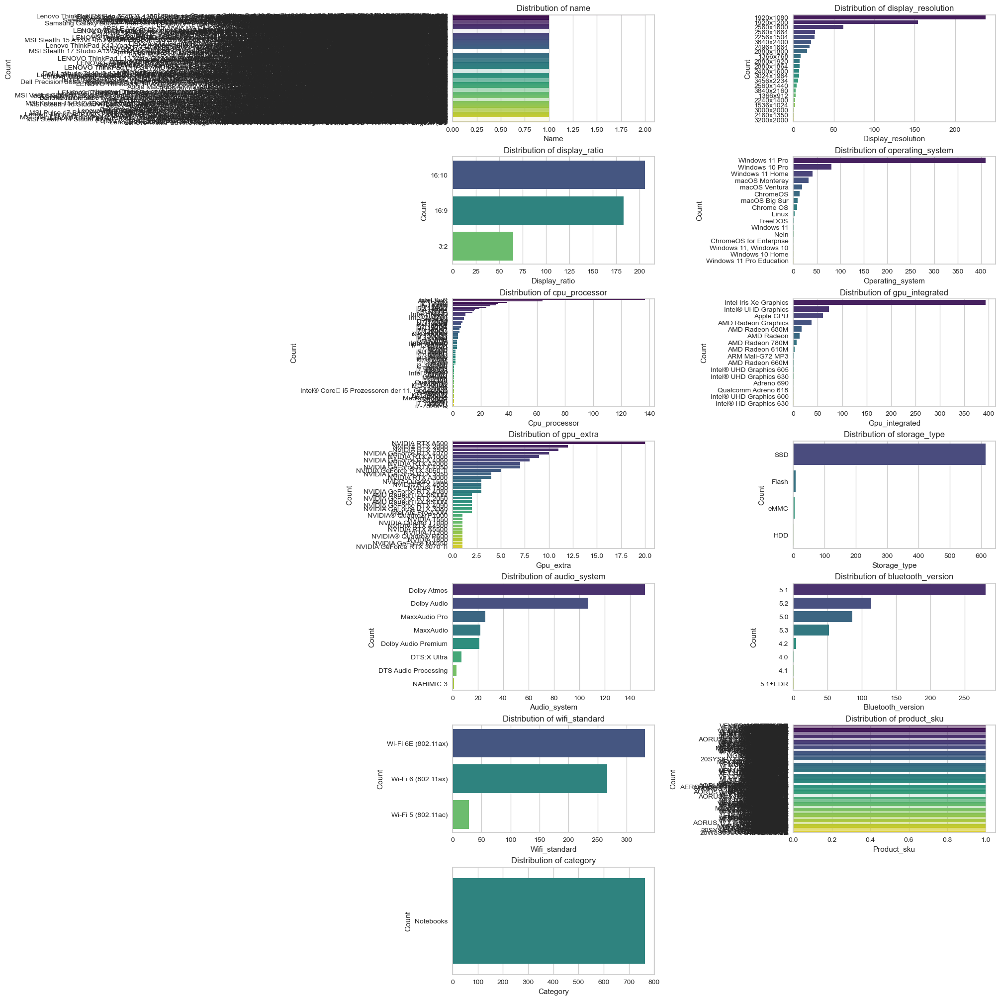

In [9]:
plot_distribution_categorical(df)

In [10]:
def plot_distribution_numerical(df):
    numerical_features = df.select_dtypes(include=np.number).columns
    num_features = len(numerical_features)
    num_cols = 2
    num_rows = (num_features + num_cols - 1) // num_cols

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(20, 20), constrained_layout=True)
    axs = axs.flatten()

    for i, col in enumerate(numerical_features):

        sns.histplot(x=col, data=df, ax=axs[i], kde=True, bins=20, color='blue', stat='density')
        
        mean, std = df[col].mean(), df[col].std()
        x = np.linspace(df[col].min(), df[col].max(), 100)
        p = norm.pdf(x, mean, std)
        axs[i].plot(x, p, 'k', linewidth=2, label='Normal dist.', color='red')

        axs[i].set_title(f'Distribution of {col}\nSkew: {df[col].skew():.4f}')
        axs[i].set_xlabel(col.capitalize())
        axs[i].set_ylabel('Density')
        axs[i].legend()

    # Remove unnecessary subplots
    for j in range(i + 1, len(axs)):
        fig.delaxes(axs[j])
        
    plt.show()

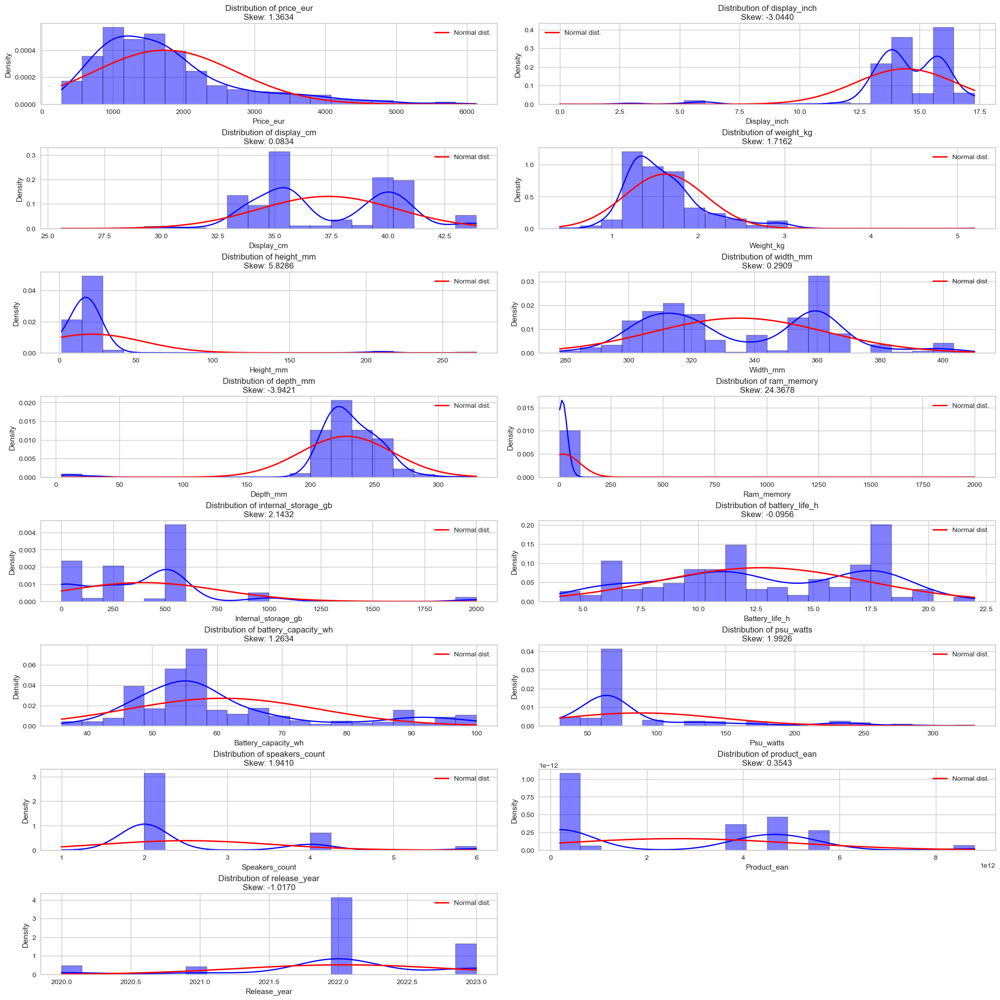

In [11]:
plot_distribution_numerical(df)

# Feature Engineering

In [12]:
df_modified = df.copy(deep=True)

In [13]:
df_modified['manufacturer'] = df_modified['name'].apply(lambda x: x.split(' ')[0])
#df_modified = df_modified.drop('name', axis=1)

In [14]:
df_modified['manufacturer'].unique()

array(['Apple', 'MSI', 'Gigabyte', 'Fujitsu', 'LENOVO', 'Lenovo', 'ACER',
       'LG', 'Dell', 'Acer', 'ThinkPad', 'Notebook', 'Microsoft', 'Terra',
       'Samsung', 'APPLE', 'INTEL', 'SAMSUNG', 'PANASONIC', 'GETAC',
       'FUJITSU', 'Corsair', 'Huawei', 'TERRA', 'Panasonic'], dtype=object)

In [15]:
# fixing duplicates
df_modified['manufacturer'] = df_modified['manufacturer'].replace({
    'ACER': 'Acer',
    'ThinkPad': 'Lenovo',
    'APPLE': 'Apple',
    'SAMSUNG': 'Samsung',
    'PANASONIC': 'Panasonic',
    'FUJITSU': 'Fujitsu',
    'TERRA': 'Terra',
    'LENOVO': 'Lenovo'
})
df_modified['manufacturer'].value_counts()

manufacturer
Lenovo       247
Apple         91
Dell          82
Acer          80
Fujitsu       79
Microsoft     62
MSI           47
Terra         17
Samsung       12
Gigabyte      12
Panasonic     12
Notebook       9
LG             8
GETAC          2
Corsair        2
INTEL          1
Huawei         1
Name: count, dtype: int64

In [16]:
# checking why some have Notebook as manufacturer
df_modified[df_modified['manufacturer'] == 'Notebook']

,name,price_eur,display_inch,display_cm,display_resolution,display_ratio,weight_kg,height_mm,width_mm,depth_mm,...,keyboard_numpad,has_webcam,has_bluetooth,bluetooth_version,wifi_standard,product_ean,product_sku,release_year,category,manufacturer
41,"Notebook 15.6"" Dell Latitude 5540 I5-1345U 16G...",1117.36,15.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,False,NaN,NaN,5.397185e+12,DCC9D,NaN,Notebooks,Notebook
519,"Notebook 17.3"" Acer Aspire 5 A517-53-58RH W11P...",824.73,17.3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,False,NaN,NaN,4.711121e+12,NX.K61EG.003,NaN,Notebooks,Notebook
593,"Notebook 15.6"" Dell Latitude 5540 I7-1365U 16G...",1360.84,15.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,False,NaN,NaN,5.397185e+12,1F8R2,NaN,Notebooks,Notebook
614,"Notebook 14"" Lenovo ThinkPad X1 Yoga G8 i7-135...",2969.59,14.0,35.6,3840x2400,16:10,1.38,15.50,314.4,222.3,...,False,True,True,5.1,Wi-Fi 6E (802.11ax),1.975295e+11,21HQ0058GE,NaN,Notebooks,Notebook
636,"Notebook 15.6"" Acer TravelMate Vero V15-51-55F...",876.76,15.6,39.6,1920x1080,16:9,1.80,17.90,363.4,238.5,...,True,True,True,5.1,Wi-Fi 6 (802.11ax),4.711121e+12,NX.VU2EG.006,NaN,Notebooks,Notebook
679,"Notebook 15.6"" Dell Latitude 3540 I5-1335U 16G...",924.98,15.6,39.6,1920x1080,16:9,1.81,1.81,359.0,239.7,...,False,True,True,NaN,Wi-Fi 6E (802.11ax),5.397185e+12,3P3CD,NaN,Notebooks,Notebook
686,"Notebook 15.6"" Dell Latitude 5540 I5-1335U 8GB...",949.03,15.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,False,NaN,NaN,5.397185e+12,WN26K,NaN,Notebooks,Notebook
693,"Notebook 15.6"" Dell Latitude 5540 I5-1335U 16G...",926.80,15.6,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,False,NaN,NaN,5.397185e+12,7363G,NaN,Notebooks,Notebook
754,Notebook Apple Macbook Pro 14 M2 PRO 10C/16C,3243.67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,False,False,False,NaN,NaN,NaN,Z17K-GR16,NaN,Notebooks,Notebook


In [17]:
# fixing the manufacturer (Notebook)
df_modified.loc[41, 'manufacturer'] = 'Dell'
df_modified.loc[519, 'manufacturer'] = 'Acer'
df_modified.loc[593, 'manufacturer'] = 'Dell'
df_modified.loc[614, 'manufacturer'] = 'Lenovo'
df_modified.loc[636, 'manufacturer'] = 'Acer'
df_modified.loc[679, 'manufacturer'] = 'Dell'
df_modified.loc[686, 'manufacturer'] = 'Dell'
df_modified.loc[693, 'manufacturer'] = 'Dell'
df_modified.loc[754, 'manufacturer'] = 'Apple'

In [18]:
# sanity check
df_modified.iloc[41]

name                   Notebook 15.6" Dell Latitude 5540 I5-1345U 16G...
price_eur                                                        1117.36
display_inch                                                        15.6
display_cm                                                           NaN
display_resolution                                                   NaN
display_ratio                                                        NaN
weight_kg                                                            NaN
height_mm                                                            NaN
width_mm                                                             NaN
depth_mm                                                             NaN
operating_system                                                     NaN
cpu_processor                                                        NaN
ram_memory                                                           NaN
gpu_integrated                                     

In [19]:
# fixing values that are in tb, also 1000 = 1024 etc...
df_modified['internal_storage_gb'] = df_modified['internal_storage_gb'].replace({
    1: 1024,
    2: 2048,
    4: 4096,
    500: 512,
    1000: 1024,
    2000: 2048
})
df_modified['internal_storage_gb'].value_counts()

internal_storage_gb
512.0     285
1024.0    147
256.0     127
2048.0     35
128.0      12
64.0        8
32.0        3
4096.0      1
Name: count, dtype: int64

In [20]:
df_modified['operating_system'].value_counts()

operating_system
Windows 11 Pro              410
Windows 10 Pro               81
Windows 11 Home              41
macOS Monterey               32
macOS Ventura                19
ChromeOS                     13
macOS Big Sur                 9
Chrome OS                     8
Linux                         3
FreeDOS                       2
Windows 11                    2
Nein                          2
ChromeOS for Enterprise       1
Windows 11, Windows 10        1
Windows 10 Home               1
Windows 11 Pro Education      1
Name: count, dtype: int64

In [21]:
df_modified[df_modified['manufacturer'] == 'Apple']['operating_system'].value_counts()

operating_system
macOS Monterey    32
macOS Ventura     19
macOS Big Sur      9
Name: count, dtype: int64

In [22]:
# dropping columns with high missing percentage
df_modified = df_modified.drop(columns=[
    'category','release_year', 'product_sku', 
    'audio_system', 'display_ratio', 'speakers_count', 
    'bluetooth_version', 'battery_life_h', 'display_cm'
])

In [23]:
df_modified.loc[df_modified['manufacturer'] == 'Apple', 'operating_system'] = 'macOS'
df_modified.loc[df_modified['operating_system'].str.contains('Windows', na=False), 'operating_system'] = 'Windows'
df_modified.loc[df_modified['operating_system'].str.contains('Chrome', na=False), 'operating_system'] = 'ChromeOS'

In [24]:
df_modified.loc[
    ~df_modified['operating_system'].isin(['Windows', 'macOS', 'ChromeOS']) &
    df_modified['operating_system'].notna(),
    'operating_system'
] = 'Other'

In [25]:
df_modified['operating_system'].value_counts()

operating_system
Windows     537
macOS        92
ChromeOS     22
Other         7
Name: count, dtype: int64

In [26]:
#pd.set_option("display.max_rows", None)
df_modified['cpu_processor'].value_counts()

cpu_processor
Intel SoC    137
AMD SoC       64
M2            39
i7-1265U      32
i5-1335U      31
            ... 
6900HS         1
N200           1
i7-10850H      1
4500U          1
i7-7820EQ      1
Name: count, Length: 85, dtype: int64

In [27]:
# not a lot of ultra performance cpus
def categorize_cpu(cpu):
    low_performance_cpus = [
        'Intel SoC', 'AMD SoC', 'i3-1115G4', 'i3-1215U', 'i3-10110U', 'i3-N305', 
        'N5030', 'N4500', 'N100', 'N5100', 'N6000', 'N4120', 'N200', '468', 
        'MT8183', 'MediaTek SoC', '3250U', '6405U', 'G6405U'
    ]
    medium_performance_cpus = [
        'i5-1135G7', 'i5-1235U', 'i5-1245U', 'i5-1335U', 'i5-1345U', 
        'i5-1340P', 'i5-1240P', 'i5-10210Y', 'i5-1035G1', 'i5-10310U', 
        'i5-1145G7', 'i5-1155G7', 'i5-12500H', 'i5-1250P', 'i7-1265U', 
        'i7-1260P', 'i7-1360P', 'i7-1370P', 'i7-11370H', 'i7-1165G7', 
        'i7-1185G7', 'i7-1270P', 'i7-1255U', 'i7-1355U', 'i7-1365U', 
        'i7-10850H', 'i7-1195G7', 'i7-8750H', '5875U', '5675U', '5500U', 
        '4500U', '4680U', '4980U', 'AMD 5875U', 'AMD 5675U'
    ]
    high_performance_cpus = [
        'i7-13700H', 'i7-12700H', 'i7-13800H', 'i7-13850HX', 'i9-12900H', 
        'i9-13900H', 'i9-13950HX', 'i9-13980HX', 'M1', 'M1 Pro', 'M2', 'M2 Pro',
        'M2 Max', 'i9-13900HX', 'i9-13980HX', '6800HS', '6900HS'
    ]
    
    if cpu in low_performance_cpus:
        return 'Low Performance'
    elif cpu in medium_performance_cpus:
        return 'Medium Performance'
    elif cpu in high_performance_cpus:
        return 'High Performance'
    else:
        # doing imputation at the same time, Low Performance is the most common one (mode)
        return 'Medium Performance'

df_modified['cpu_performance'] = df_modified['cpu_processor'].apply(categorize_cpu)

df_modified['cpu_performance'].value_counts()

cpu_performance
Medium Performance    431
Low Performance       233
High Performance      100
Name: count, dtype: int64

In [28]:
df_modified.loc[
    df_modified['cpu_processor'].str.contains('Intel', na=False) |
    df_modified['gpu_integrated'].str.contains('Intel', na=False),
    'cpu_processor_manufacturer'
] = 'Intel'

df_modified.loc[
    df_modified['cpu_processor'].str.contains('AMD', na=False) |
    df_modified['gpu_integrated'].str.contains('AMD', na=False),
    'cpu_processor_manufacturer'
] = 'AMD'

df_modified.loc[
    df_modified['gpu_integrated'].str.contains('Apple', na=False),
    'cpu_processor_manufacturer'
] = 'Apple'

df_modified.loc[
    df_modified['cpu_processor'].str.contains('i7', na=False) |
    df_modified['cpu_processor'].str.contains('i5', na=False),
    'cpu_processor_manufacturer'
] = 'Intel'
#
df_modified.loc[df_modified['cpu_processor_manufacturer'].str.contains('nan', na=False), 'cpu_processor_manufacturer'] = 'Intel'

In [29]:
df_modified['cpu_processor_manufacturer'].value_counts()

cpu_processor_manufacturer
Intel    624
AMD       79
Apple     61
Name: count, dtype: int64

In [30]:
df_modified.loc[df_modified['gpu_integrated'].str.contains('Intel', na=False), 'gpu_integrated_manufacturer'] = 'Intel'
df_modified.loc[df_modified['gpu_integrated'].str.contains('AMD', na=False), 'gpu_integrated_manufacturer'] = 'AMD'

In [31]:
df_modified.loc[df_modified['gpu_integrated_manufacturer'].str.contains('nan', na=False), 'gpu_integrated_manufacturer'] = 'Intel'

In [32]:
df_modified['gpu_integrated_manufacturer'].value_counts()

gpu_integrated_manufacturer
Intel    685
AMD       79
Name: count, dtype: int64

In [33]:
df_modified['gpu_integrated'].value_counts()

gpu_integrated
Intel Iris Xe Graphics     394
Intel® UHD Graphics         73
Apple GPU                   61
AMD Radeon Graphics         37
AMD Radeon 680M             17
AMD Radeon                  13
AMD Radeon 780M              7
AMD Radeon 610M              3
ARM Mali-G72 MP3             2
AMD Radeon 660M              2
Intel® UHD Graphics 605      2
Intel® UHD Graphics 630      2
Adreno 690                   1
Qualcomm Adreno 618          1
Intel® UHD Graphics 600      1
Intel® HD Graphics 630       1
Name: count, dtype: int64

In [34]:
def categorize_gpu_integrated(gpu):
    low_performance_gpus = [
        'Intel® UHD Graphics', 'Intel® HD Graphics', 'Intel Iris Xe Graphics', 
        'Apple GPU', 'AMD Radeon 610M'
    ]
    medium_performance_gpus = [
        'Intel Iris Xe Graphics', 'AMD Radeon', 'AMD Radeon 660M', 
        'Intel® UHD Graphics 605', 'Intel® UHD Graphics 630'
    ]
    high_performance_gpus = ['AMD Radeon 680M', 'AMD Radeon 780M']
    
    if gpu in low_performance_gpus:
        return 'Low Performance'
    elif gpu in medium_performance_gpus:
        return 'Medium Performance'
    elif gpu in high_performance_gpus:
        return 'High Performance'
    else:
        # doing imputation at the same time, Low Performance is the most common one (mode)
        return 'Low Performance'

In [35]:
df_modified['gpu_integrated_performance'] = df_modified['gpu_integrated'].apply(categorize_gpu_integrated)

df_modified['gpu_integrated_performance'].value_counts()

gpu_integrated_performance
Low Performance       721
High Performance       24
Medium Performance     19
Name: count, dtype: int64

## gpu_extra

In [36]:
df_modified.loc[df_modified['gpu_extra'].str.contains('Intel', na=False), 'gpu_extra_manufacturer'] = 'Intel'
df_modified.loc[df_modified['gpu_extra'].str.contains('AMD', na=False), 'gpu_extra_manufacturer'] = 'AMD'
df_modified.loc[df_modified['gpu_extra'].str.contains('NVIDIA', na=False), 'gpu_extra_manufacturer'] = 'NVIDIA'
df_modified.loc[df_modified['gpu_extra_manufacturer'].str.contains('nan', na=False), 'gpu_extra_manufacturer'] = 'None'

In [37]:
df_modified['gpu_extra_manufacturer'].value_counts()

gpu_extra_manufacturer
None      633
NVIDIA    125
AMD         4
Intel       2
Name: count, dtype: int64

In [38]:
df_modified['gpu_extra'].value_counts()

gpu_extra
NVIDIA RTX A500               20
NVIDIA RTX 2000               12
NVIDIA RTX 3500               11
NVIDIA GeForce RTX 4070       10
NVIDIA RTX A1000               9
NVIDIA GeForce RTX 4060        8
NVIDIA RTX A2000               7
NVIDIA GeForce RTX 4050        7
NVIDIA GeForce RTX 3050 Ti     5
NVIDIA GeForce RTX 3050        4
NVIDIA RTX A3000               4
NVIDIA Quadro T550             3
NVIDIA RTX 4000                3
NVIDIA T500                    3
NVIDIA GeForce RTX 4080        3
AMD Radeon RX 6800M            2
NVIDIA GeForce RTX 2050        2
AMD Radeon RX 6500M            2
NVIDIA GeForce RTX 4090        2
NVIDIA GeForce RTX 3080        2
Intel Arc Pro A30M             2
NVIDIA® Quadro® P1000          1
NVIDIA T550                    1
NVIDIA Quadro T1000            1
NVIDIA RTX A4500               1
NVIDIA RTX A5500               1
NVIDIA T1200                   1
NVIDIA® Quadro® P600           1
NVIDIA T600                    1
NVIDIA GeForce MX550           1


In [39]:
def categorize_gpu_extra(gpu):
    low_performance_gpus = [
        'NVIDIA GeForce MX550', 'NVIDIA® Quadro® P600', 'NVIDIA® Quadro® P1000',
        'NVIDIA T500', 'NVIDIA T550', 'NVIDIA T600', 'NVIDIA T1200', 
        'NVIDIA Quadro T550', 'NVIDIA Quadro T1000', 'NVIDIA GeForce RTX 2050',
        'Intel Arc Pro A30M'
    ]
    medium_performance_gpus = [
        'NVIDIA RTX A500', 'NVIDIA RTX 2000', 'NVIDIA RTX A1000', 
        'NVIDIA RTX A2000', 'NVIDIA RTX A3000', 'NVIDIA GeForce RTX 3050', 
        'NVIDIA GeForce RTX 3050 Ti', 'NVIDIA GeForce RTX 4050', 
        'NVIDIA GeForce RTX 4060', 'NVIDIA GeForce RTX 4070', 
        'NVIDIA GeForce RTX 4080', 'NVIDIA RTX 3500', 'NVIDIA RTX 4000', 
        'AMD Radeon RX 6500M', 'AMD Radeon RX 6800M'
    ]
    high_performance_gpus = [
        'NVIDIA RTX A4500', 'NVIDIA RTX A5500', 'NVIDIA GeForce RTX 3080', 
        'NVIDIA GeForce RTX 4090', 'NVIDIA GeForce RTX 3070 Ti'
    ]
    
    if gpu in low_performance_gpus:
        return 'Low Performance'
    elif gpu in medium_performance_gpus:
        return 'Medium Performance'
    elif gpu in high_performance_gpus:
        return 'High Performance'
    else:
        # meaning they only have integrated gpu
        return 'None'

In [40]:
df_modified['gpu_extra_performance'] = df_modified['gpu_extra'].apply(categorize_gpu_extra)

df_modified['gpu_extra_performance'].value_counts()

gpu_extra_performance
None                  633
Medium Performance    107
Low Performance        17
High Performance        7
Name: count, dtype: int64

In [41]:
df_modified['storage_type'].value_counts()

storage_type
SSD      614
Flash      8
eMMC       4
HDD        1
Name: count, dtype: int64

In [42]:
df_modified = df_modified.drop(columns=['storage_type', 'name', 'product_ean'])

In [43]:
df_modified.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 764 entries, 0 to 763
Data columns (total 28 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   price_eur                    764 non-null    float64
 1   display_inch                 763 non-null    float64
 2   display_resolution           628 non-null    object 
 3   weight_kg                    616 non-null    float64
 4   height_mm                    627 non-null    float64
 5   width_mm                     627 non-null    float64
 6   depth_mm                     627 non-null    float64
 7   operating_system             658 non-null    object 
 8   cpu_processor                628 non-null    object 
 9   ram_memory                   627 non-null    float64
 10  gpu_integrated               617 non-null    object 
 11  gpu_extra                    131 non-null    object 
 12  internal_storage_gb          618 non-null    float64
 13  battery_capacity_wh 

In [44]:
df_modified['display_resolution'].value_counts()

display_resolution
1920x1080    238
1920x1200    154
2560x1600     62
2560x1664     27
2256x1504     26
3840x2400     22
2496x1664     20
2880x1800     17
1366x768       9
2880x1920      8
2880x1864      8
2400x1600      7
3024x1964      7
3456x2234      6
2560x1440      4
3840x2160      3
1366x912       3
2240x1400      2
1536x1024      2
3000x2000      1
2160x1350      1
3200x2000      1
Name: count, dtype: int64

In [45]:
def categorize_resolution(resolution):
    try:
        width, height = map(int, resolution.split('x'))
        if (width == 1920 and height in [1080, 1200]) or (width == 1366 and height in [768, 912]):
            return 'Full HD'
        elif width in [2560, 2256, 2496, 2400, 2880, 3024, 3456] or height in [1600, 1440, 1664, 1504, 1864, 1964, 2234]:
            return '2K'
        elif width in [3840, 3000, 3200] or height in [2160, 2400, 2000]:
            return '4K'
        else:
            return 'High Definition'
    except:
        return 'Unknown'

In [46]:
df_modified['display_resolution'] = df_modified['display_resolution'].apply(categorize_resolution)

In [47]:
df_modified['display_resolution'].value_counts()

display_resolution
Full HD            404
2K                 192
Unknown            136
4K                  27
High Definition      5
Name: count, dtype: int64

In [48]:
df_modified.loc[df_modified['display_resolution'] == 'Unknown', 'display_resolution'] = 'Full HD'

In [49]:
df_modified.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 764 entries, 0 to 763
Data columns (total 28 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   price_eur                    764 non-null    float64
 1   display_inch                 763 non-null    float64
 2   display_resolution           764 non-null    object 
 3   weight_kg                    616 non-null    float64
 4   height_mm                    627 non-null    float64
 5   width_mm                     627 non-null    float64
 6   depth_mm                     627 non-null    float64
 7   operating_system             658 non-null    object 
 8   cpu_processor                628 non-null    object 
 9   ram_memory                   627 non-null    float64
 10  gpu_integrated               617 non-null    object 
 11  gpu_extra                    131 non-null    object 
 12  internal_storage_gb          618 non-null    float64
 13  battery_capacity_wh 

In [50]:
df_modified['wifi_standard'].value_counts()

wifi_standard
Wi-Fi 6E (802.11ax)    332
Wi-Fi 6 (802.11ax)     267
Wi-Fi 5 (802.11ac)      28
Name: count, dtype: int64

In [51]:
missing_percentage = df_modified.isnull().mean() * 100

missing_percentage

price_eur                       0.000000
display_inch                    0.130890
display_resolution              0.000000
weight_kg                      19.371728
height_mm                      17.931937
width_mm                       17.931937
depth_mm                       17.931937
operating_system               13.874346
cpu_processor                  17.801047
ram_memory                     17.931937
gpu_integrated                 19.240838
gpu_extra                      82.853403
internal_storage_gb            19.109948
battery_capacity_wh            24.083770
psu_watts                      24.607330
has_touchscreen                 0.000000
keyboard_backlit                0.000000
keyboard_numpad                 0.000000
has_webcam                      0.000000
has_bluetooth                   0.000000
wifi_standard                  17.931937
manufacturer                    0.000000
cpu_performance                 0.000000
cpu_processor_manufacturer      0.000000
gpu_integrated_m

In [52]:
# Mode: operating_system, cpu_processor, gpu_integrated, wifi_standard 
# Mean: display_inch, weight_kg, height_mm, width_mm, depth_mm, ram_memory, internal_storage_gb, battery_capacity_wh, psu_watts
features_mode = ['operating_system', 'wifi_standard']
features_mean = [
    'display_inch', 'weight_kg', 'height_mm',
    'width_mm', 'depth_mm', 'ram_memory',
    'internal_storage_gb', 'battery_capacity_wh', 'psu_watts'
]

df_modified[features_mode] = df_modified[features_mode].fillna(df_modified.mode().iloc[0])
df_modified[features_mean] = df_modified[features_mean].fillna(df_modified[features_mean].mean())
df_modified.isna().sum()

price_eur                        0
display_inch                     0
display_resolution               0
weight_kg                        0
height_mm                        0
width_mm                         0
depth_mm                         0
operating_system                 0
cpu_processor                  136
ram_memory                       0
gpu_integrated                 147
gpu_extra                      633
internal_storage_gb              0
battery_capacity_wh              0
psu_watts                        0
has_touchscreen                  0
keyboard_backlit                 0
keyboard_numpad                  0
has_webcam                       0
has_bluetooth                    0
wifi_standard                    0
manufacturer                     0
cpu_performance                  0
cpu_processor_manufacturer       0
gpu_integrated_manufacturer      0
gpu_integrated_performance       0
gpu_extra_manufacturer           0
gpu_extra_performance            0
dtype: int64

In [53]:
df_modified = df_modified.drop(columns=['cpu_processor', 'gpu_integrated', 'gpu_extra'])

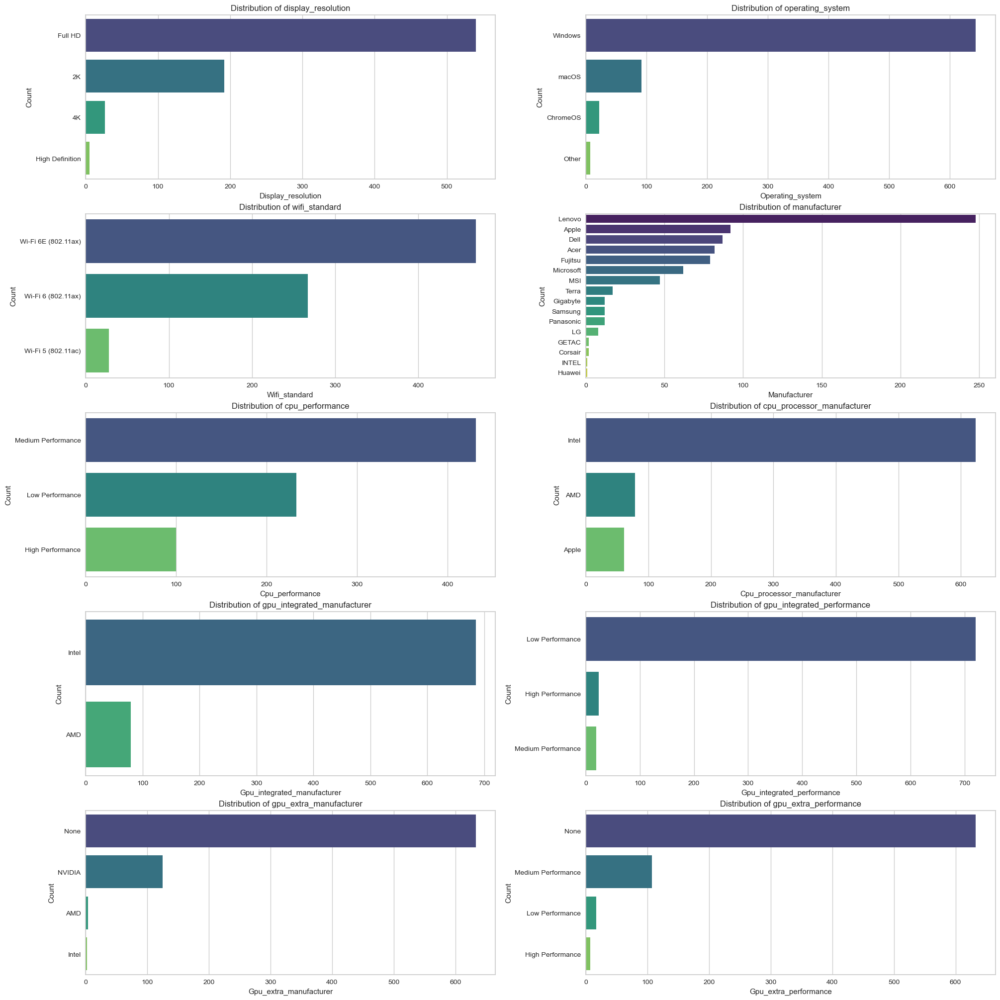

In [54]:
plot_distribution_categorical(df_modified)

In [55]:
df_modified['gpu_extra_manufacturer'].value_counts()

gpu_extra_manufacturer
None      633
NVIDIA    125
AMD         4
Intel       2
Name: count, dtype: int64

In [56]:
df_modified['gpu_extra_performance'].value_counts()

gpu_extra_performance
None                  633
Medium Performance    107
Low Performance        17
High Performance        7
Name: count, dtype: int64

In [57]:
df_modified = df_modified[df_modified['cpu_processor_manufacturer'].isin(['Apple', 'Intel', 'AMD'])]
df_modified = df_modified[df_modified['gpu_extra_manufacturer'].isin(['None', 'NVIDIA'])]
df_modified = df_modified[df_modified['operating_system'] != 'Other']
df_modified = df_modified[df_modified['display_resolution'] != 'High Definition']
manufacturers_to_other = [
    'Huawei', 'INTEL', 'GETAC', 'LG', 'Gigabyte', 'Panasonic', 
    'Samsung', 'Terra', 'MSI', 'Microsoft'
]
df_modified.loc[df_modified['manufacturer'].isin(manufacturers_to_other), 'manufacturer'] = 'Other'

In [58]:
def perform_anderson_darling_test(df, column):
    result = anderson(df[column])
    ad_stat = result.statistic
    critical_values = result.critical_values
    significance_levels = result.significance_level

    print(f'Anderson-Darling Test for {column}')
    print(f'AD Statistic: {ad_stat:.4f}')
    print('Critical Values and Significance Levels:')
    for crit_val, sig_lvl in zip(critical_values, significance_levels):
        print(f'  Significance Level {sig_lvl}%: {crit_val:.4f}')
    
    return ad_stat, critical_values, significance_levels

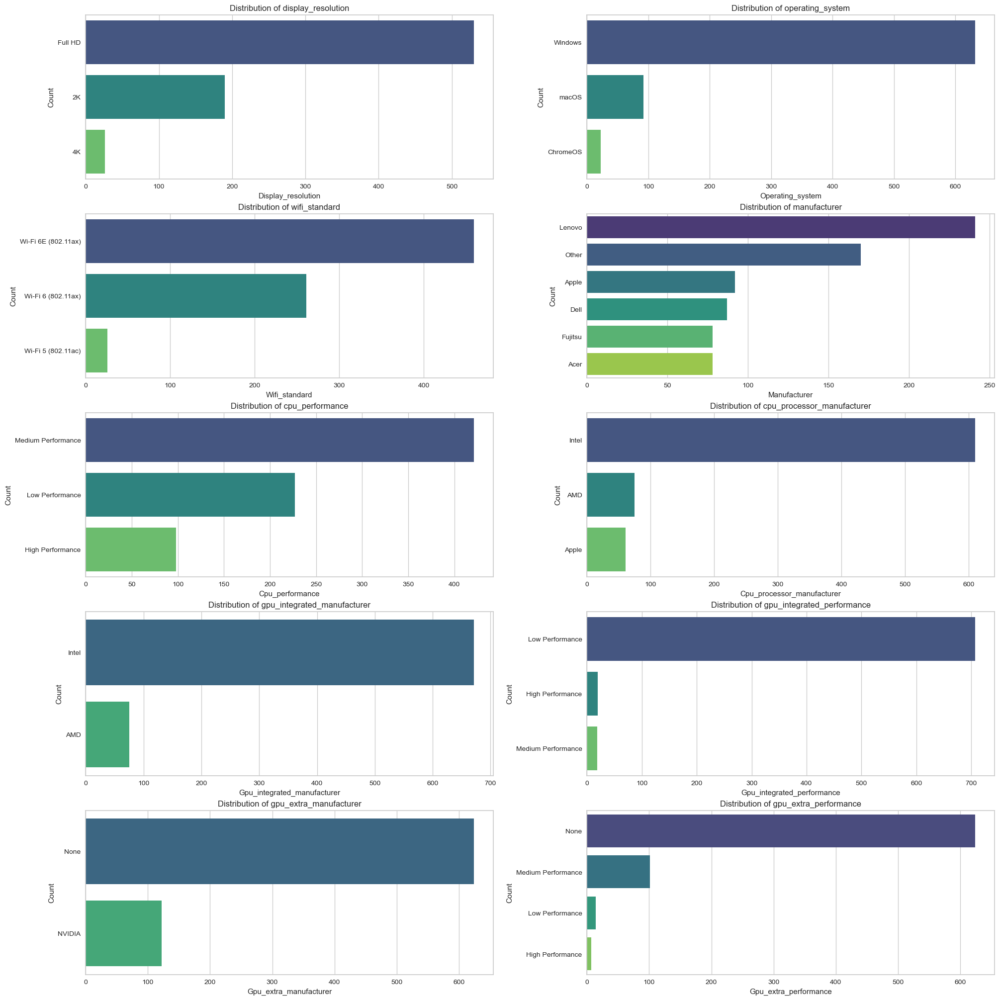

In [59]:
plot_distribution_categorical(df_modified)
# one-hot: os, wifi, manufacturer, cpu_m, gpu_i_m, gpu_e_m
# ordinal: resolution, wifi, cpu_p, gpu_i_p, gpu_e_p

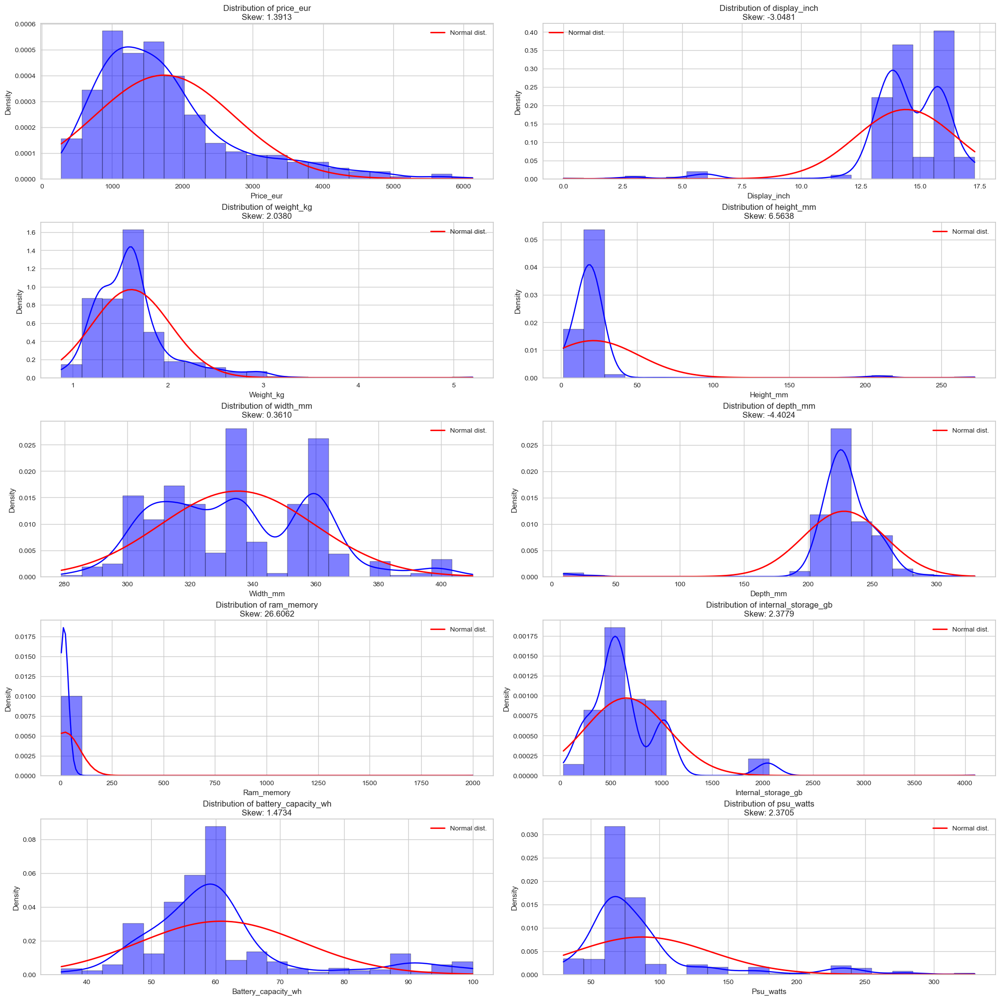

In [60]:
plot_distribution_numerical(df_modified)

In [61]:
df_modified.shape

(746, 25)

In [62]:
def plot_outliers(df):
    numerical_features = df.select_dtypes(include=np.number).columns
    num_features = len(numerical_features)
    num_cols = 2
    num_rows = (num_features + num_cols - 1) // num_cols

    fig, axs = plt.subplots(num_rows, num_cols, figsize=(10, 20), constrained_layout=True)
    axs = axs.flatten()
    
    for i, col in enumerate(numerical_features):
        sns.boxplot(y=col, data=df, ax=axs[i], palette='viridis')
        ax=axs[i].set_title(col.capitalize())

    # removing uneccessary (sub)plots
    for j in range(i + 1, len(axs)):
        fig.delaxes(axs[j])  
        
    plt.show()

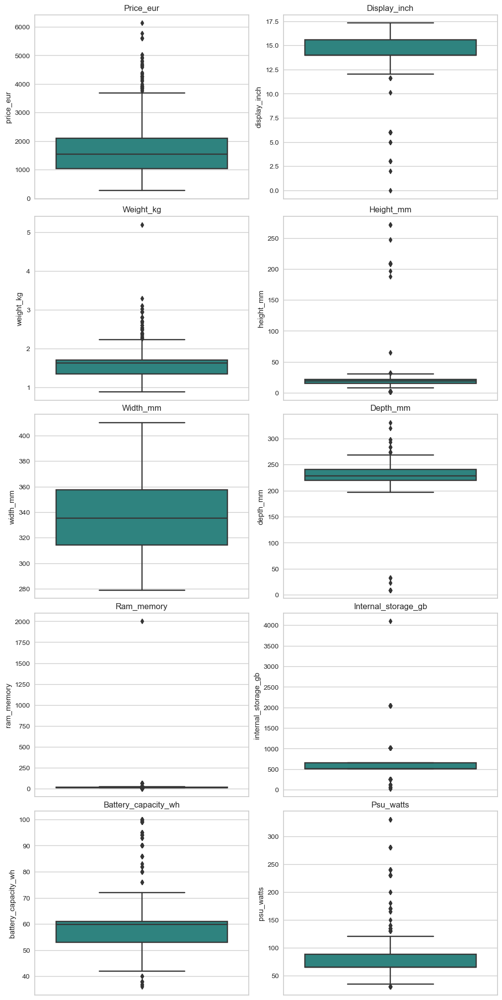

In [63]:
plot_outliers(df_modified)

In [64]:
df_modified.describe()

,price_eur,display_inch,weight_kg,height_mm,width_mm,depth_mm,ram_memory,internal_storage_gb,battery_capacity_wh,psu_watts
count,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000,746.000000
mean,1741.532051,14.403648,1.613611,21.278731,335.109003,228.187009,20.854317,654.168059,60.818748,87.489090
std,994.115530,2.112710,0.411653,29.710413,24.601831,32.114312,73.198594,410.424352,12.667020,49.848098
min,276.800000,0.000000,0.879000,1.490000,279.000000,9.300000,4.000000,32.000000,36.000000,30.000000
25%,1041.947500,14.000000,1.340000,15.400000,314.400000,219.300000,16.000000,512.000000,53.000000,65.000000
50%,1535.800000,14.000000,1.618625,18.900000,335.288357,228.200797,16.000000,512.000000,59.800000,65.000000
75%,2104.230000,15.600000,1.700000,21.511053,357.400000,240.300000,20.803828,658.381877,60.913534,88.184028
max,6130.110000,17.300000,5.200000,272.000000,410.000000,330.000000,2000.000000,4096.000000,100.000000,330.000000


dropped 18 rows for now

In [65]:
df_modified = df_modified[df_modified['ram_memory'] != 2000]
df_modified = df_modified[df_modified['display_inch'] > 10]

In [66]:
def outliers_iqr(df):
    numerical_features = df.select_dtypes(include=np.number).columns
    outliers = []

    for col in numerical_features:
        Q1 = df[col].quantile(0.25)
        Q3 = df[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        outliers_col = df[(df[col] < lower_bound) | (df[col] > upper_bound)].index
        outliers.extend(outliers_col)
        
    outliers = list(set(outliers))
    
    return outliers

In [67]:
len(outliers_iqr(df_modified))

435

In [68]:
def outliers_zscore(df, threshold=3):
    numerical_features = df.select_dtypes(include=np.number).columns
    outliers = []

    for col in numerical_features:
        z_scores = zscore(df[col], nan_policy='omit')
        abs_z_scores = np.abs(z_scores)
        
        outliers_col = df[col][abs_z_scores > threshold].index
        outliers.extend(outliers_col)
        
    outliers = list(set(outliers))

    return outliers

In [69]:
len(outliers_zscore(df_modified))

82

In [70]:
def outliers_isolation_forest(df, contamination='auto'):
    numerical_features = df.select_dtypes(include=np.number).columns
    outliers = []
    
    isolation_forest = IsolationForest(random_state=42, contamination=contamination)

    isolation_forest.fit(df[numerical_features])

    y_pred = isolation_forest.predict(df[numerical_features])

    outliers = df[y_pred == -1].index
    
    return outliers

In [71]:
len(outliers_isolation_forest(df_modified))

98

In [72]:
df_no_transformations = df_modified.copy(deep=True)

In [73]:
log_transform_features = ['height_mm', 'depth_mm', 'internal_storage_gb']
for col in log_transform_features:
    minimum = df_modified[col].min()
    df_modified[col] = df_modified[col] - minimum + 1
    df_modified[col] = np.log(df_modified[col])

In [74]:
bins = [0, 1000, 2000, 3500, float('inf')]
labels = ["Budget", "Mid-Range", "High-End", "Premium"]
df_modified['price'] = pd.cut(df_modified['price_eur'], bins=bins, labels=labels, right=False)
df_modified = df_modified.drop(columns=['price_eur'])

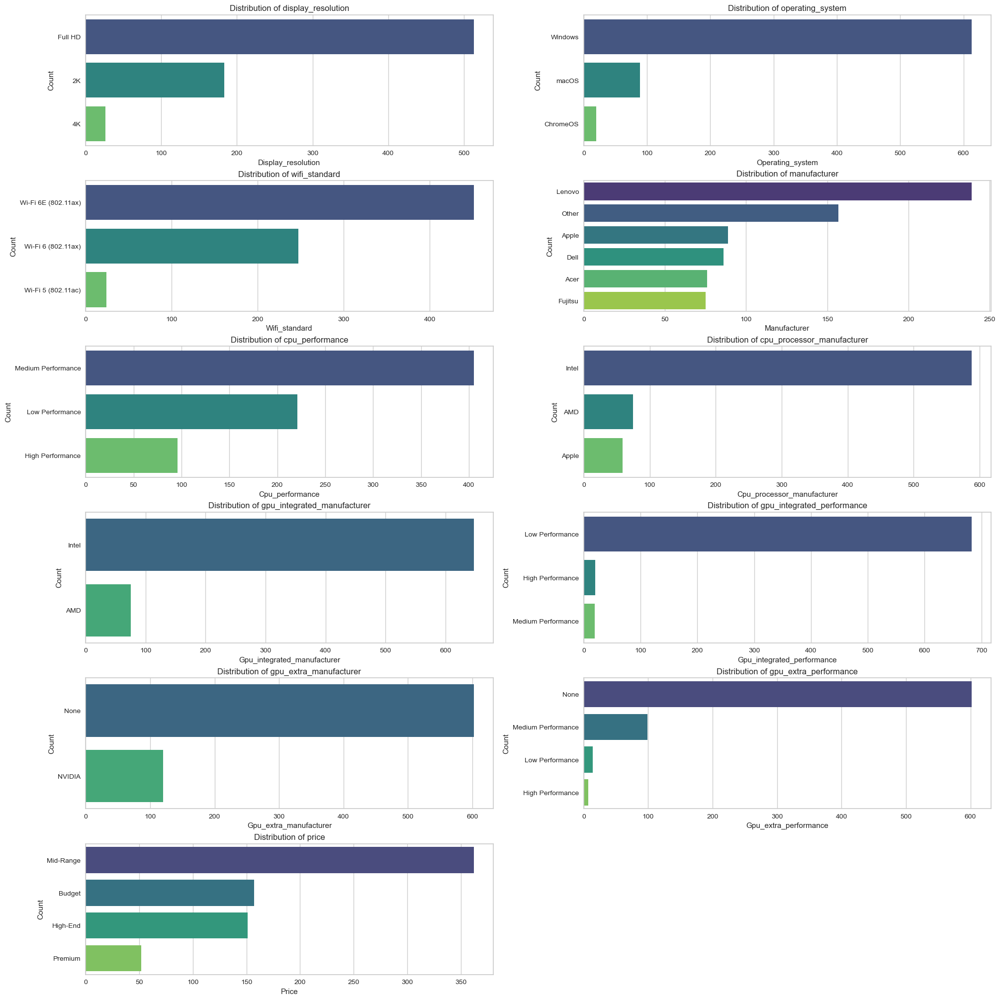

In [75]:
plot_distribution_categorical(df_modified)

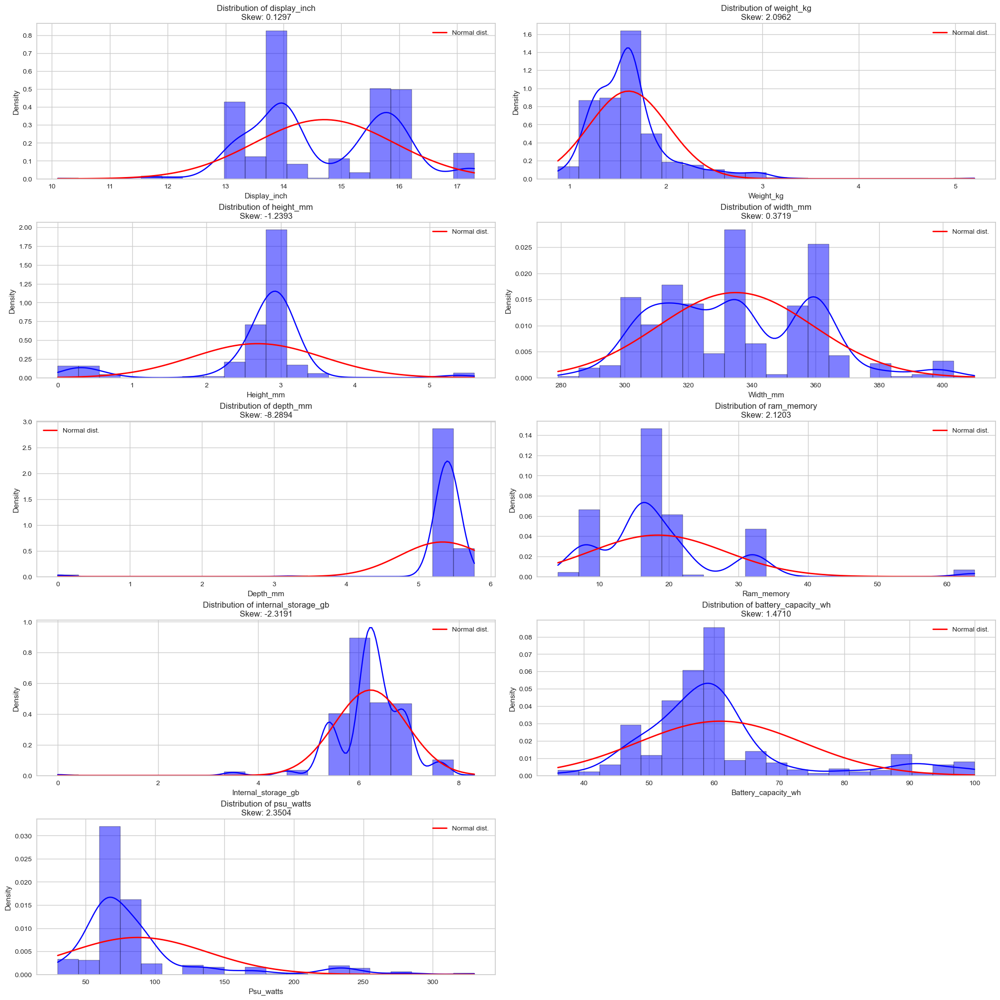

In [76]:
plot_distribution_numerical(df_modified)

In [77]:
# one-hot: os, wifi, manufacturer, cpu_m, gpu_i_m, gpu_e_m
# ordinal: resolution, wifi, cpu_p, gpu_i_p, gpu_e_p
one_hot_features = [
    'operating_system','wifi_standard', 'manufacturer', 'cpu_processor_manufacturer',
    'gpu_integrated_manufacturer', 'gpu_extra_manufacturer'
]

one_hot_features_drop_first = [
    'has_touchscreen', 'keyboard_backlit',
    'keyboard_numpad', 'has_webcam', 'has_bluetooth',
]

df_modified = pd.get_dummies(df_modified, columns=one_hot_features)
df_modified = pd.get_dummies(df_modified, columns=one_hot_features_drop_first, drop_first=True)

display_resolution_categories = [['Full HD', '2K', '4K']]
display_resolution_encoder = OrdinalEncoder(categories=display_resolution_categories)
df_modified['display_resolution'] = display_resolution_encoder.fit_transform(df_modified[['display_resolution']])

cpu_performance_categories = [['Low Performance', 'Medium Performance', 'High Performance']]
cpu_performance_encoder = OrdinalEncoder(categories=cpu_performance_categories)
df_modified['cpu_performance'] = cpu_performance_encoder.fit_transform(df_modified[['cpu_performance']])

gpu_integrated_performance_categories = [['Low Performance', 'Medium Performance', 'High Performance']]
gpu_integrated_performance_encoder = OrdinalEncoder(categories=gpu_integrated_performance_categories)
df_modified['gpu_integrated_performance'] = gpu_integrated_performance_encoder.fit_transform(df_modified[['gpu_integrated_performance']])

gpu_extra_performance_categories = [['None', 'Low Performance', 'Medium Performance', 'High Performance']]
gpu_extra_performance_encoder = OrdinalEncoder(categories=gpu_extra_performance_categories)
df_modified['gpu_extra_performance'] = gpu_extra_performance_encoder.fit_transform(df_modified[['gpu_extra_performance']])


price_category_encoder = OrdinalEncoder()
df_modified['price'] = price_category_encoder.fit_transform(df_modified[['price']])

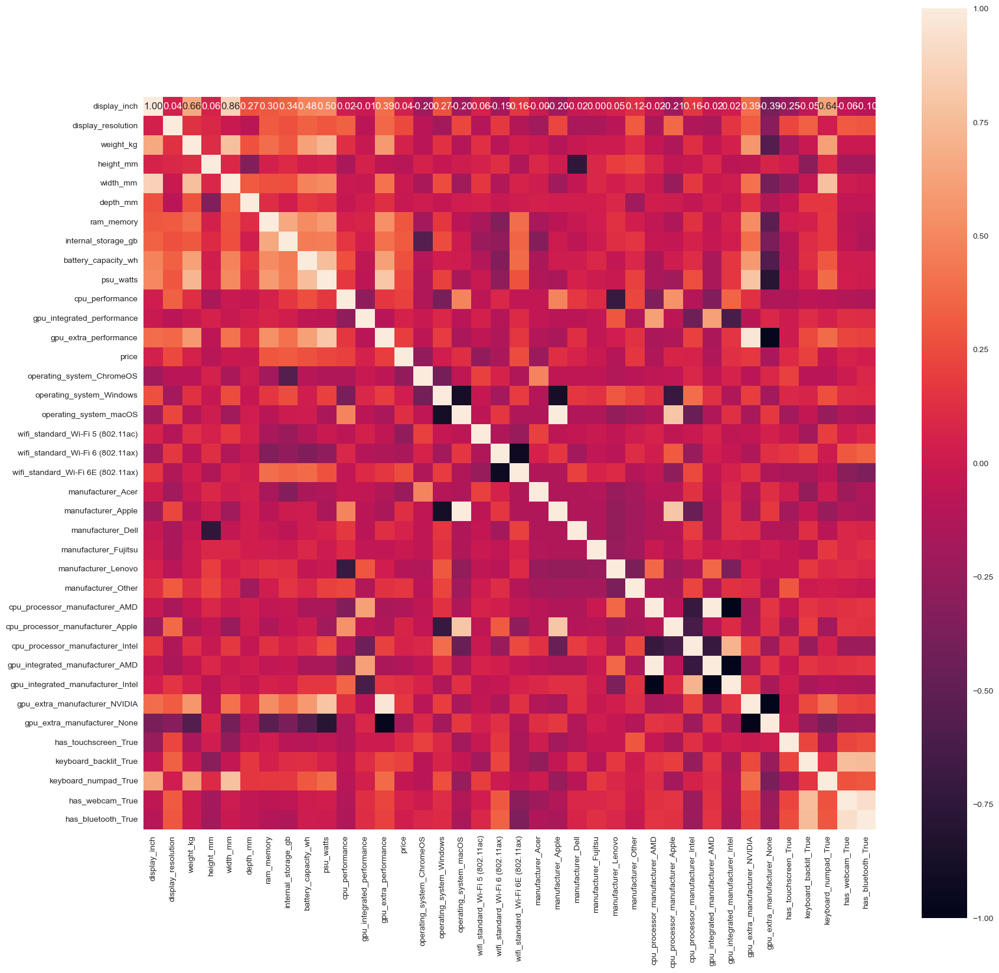

In [78]:
numeric_features_corr = df_modified.select_dtypes(include='number').columns
corr = df_modified.corr().apply(lambda x: round(x, 2))
plt.figure(figsize=(20, 20))
sns.heatmap(corr, annot=True, fmt=".2f", square=True)
plt.show()

In [79]:
df_modified = df_modified.drop(columns=[
    'cpu_processor_manufacturer_Apple', 'psu_watts', 'width_mm', 'weight_kg',
    'gpu_integrated_manufacturer_Intel', 'gpu_integrated_manufacturer_AMD'
])

In [80]:
scaler = MinMaxScaler()
scaled_data = scaler.fit_transform(df_modified)
df_minmax = pd.DataFrame(scaled_data, columns=df_modified.columns)

In [81]:
# # one-hot: os, wifi, manufacturer, cpu_m, gpu_i_m, gpu_e_m
# # ordinal: resolution, wifi, cpu_p, gpu_i_p, gpu_e_p
# one_hot_features = [
#     'operating_system', 'has_touchscreen', 'keyboard_backlit',
#     'keyboard_numpad', 'has_webcam', 'has_bluetooth',
#     'wifi_standard', 'manufacturer', 'cpu_processor_manufacturer',
#     'gpu_integrated_manufacturer', 'gpu_extra_manufacturer'
# ]

# df_no_transformations = pd.get_dummies(df_no_transformations, columns=one_hot_features, drop_first=True)

# display_resolution_categories = [['Full HD', '2K', '4K']]
# display_resolution_encoder = OrdinalEncoder(categories=display_resolution_categories)
# df_no_transformations['display_resolution'] = display_resolution_encoder.fit_transform(df_no_transformations[['display_resolution']])

# cpu_performance_categories = [['Low Performance', 'Medium Performance', 'High Performance']]
# cpu_performance_encoder = OrdinalEncoder(categories=cpu_performance_categories)
# df_no_transformations['cpu_performance'] = cpu_performance_encoder.fit_transform(df_no_transformations[['cpu_performance']])

# gpu_integrated_performance_categories = [['Low Performance', 'Medium Performance', 'High Performance']]
# gpu_integrated_performance_encoder = OrdinalEncoder(categories=gpu_integrated_performance_categories)
# df_no_transformations['gpu_integrated_performance'] = gpu_integrated_performance_encoder.fit_transform(df_no_transformations[['gpu_integrated_performance']])

# gpu_extra_performance_categories = [['None', 'Low Performance', 'Medium Performance', 'High Performance']]
# gpu_extra_performance_encoder = OrdinalEncoder(categories=gpu_extra_performance_categories)
# df_no_transformations['gpu_extra_performance'] = gpu_extra_performance_encoder.fit_transform(df_no_transformations[['gpu_extra_performance']])


In [82]:
# numeric_features_corr = df_no_transformations.select_dtypes(include='number').columns
# corr = df_no_transformations[numeric_features_corr].corr().apply(lambda x: round(x, 2))
# plt.figure(figsize=(15, 15))
# sns.heatmap(corr, annot=True, fmt=".2f", square=True)
# plt.show()
# corr

In [83]:
# df_no_transformations = df_no_transformations.drop(columns=['psu_watts', 'width_mm', 'weight_kg'])

In [84]:
# scaler = MinMaxScaler()
# scaled_data = scaler.fit_transform(df_no_transformations)
# df_no_transformations_minmax = pd.DataFrame(scaled_data, columns=df_no_transformations.columns)

# PCA visualization

In [85]:
def plot_pca_2d(df):
    pca = PCA(n_components=2)
    df_pca = pd.DataFrame(pca.fit_transform(df))
    df_pca.columns = ['PC1', 'PC2']

    fig = plt.figure(figsize=(5, 5))
    ax = fig.add_subplot(111, projection='2d')


    scatter = ax.scatter(df_pca['PC1'], df_pca['PC2'])

    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')


    fig = plt.figure()
    ax.set_title("PCA 2d visualization") 
    plt.show()
    
    fig = px.scatter_3d(df_pca, x='PC1', y='PC2')
    fig.show()

In [86]:
def plot_pca_3d(df):
    pca = PCA(n_components=3)
    df_pca = pd.DataFrame(pca.fit_transform(df))
    df_pca.columns = ['PC1', 'PC2', 'PC3']

    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')


    scatter = ax.scatter(df_pca['PC1'], df_pca['PC2'], df_pca['PC3'])

    ax.set_xlabel('PC1')
    ax.set_ylabel('PC2')
    ax.set_zlabel('PC3')


    fig = plt.figure()
    ax.set_title("PCA 3d visualization") 
    plt.show()
    
    fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3')
    fig.show()

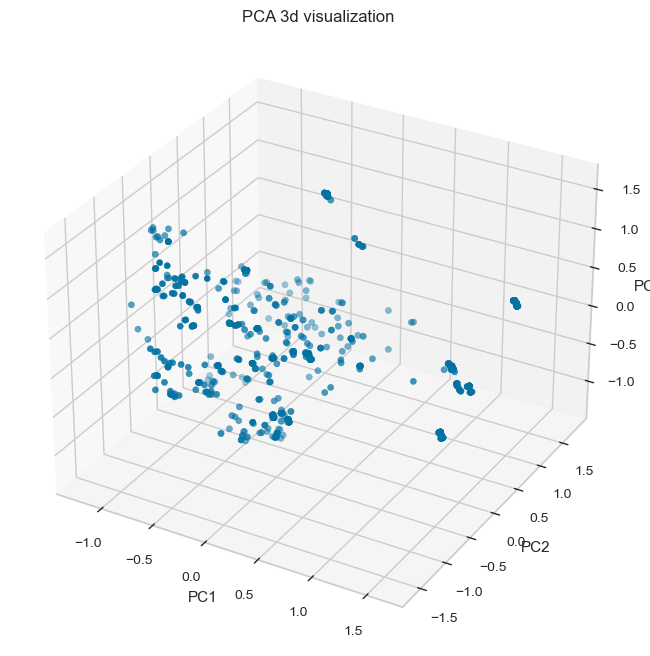

<Figure size 800x550 with 0 Axes>

In [87]:
plot_pca_3d(df_minmax)

In [88]:
def plot_elbow_and_silhouette(df):
    wcss = [] 
    silhouette_scores = []

    clusters = range(2, 11)
    for c in clusters: 
        kmeans = KMeans(n_clusters = c, random_state = 42)
        kmeans.fit(df) 
        wcss.append(kmeans.inertia_)
        silhouette = silhouette_score(df, kmeans.labels_)
        silhouette_scores.append(silhouette)

    plt.figure(figsize=(5, 5))
    plt.plot(clusters, wcss, marker='o', linestyle='--')
    plt.xlabel('Number of Clusters')
    plt.ylabel('WCSS')
    plt.title('Elbow Method')
    plt.show()

    plt.figure(figsize=(5, 5))
    plt.plot(clusters, silhouette_scores, marker='o', linestyle='--')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Silhouette')
    plt.title('Silhouette')
    plt.show()

In [89]:
def plot_silhouette_birch(df):
    silhouette_scores = []

    clusters = range(2, 11)
    for c in clusters: 
        birch = Birch(n_clusters = c)
        birch.fit(df) 

        silhouette = silhouette_score(df, birch.labels_)
        silhouette_scores.append(silhouette)

    plt.figure(figsize=(5, 5))
    plt.plot(clusters, silhouette_scores, marker='o', linestyle='--')
    plt.xlabel('Number of Clusters')
    plt.ylabel('Silhouette')
    plt.title('Silhouette')
    plt.show()

In [90]:
def plot_elbow_and_silhouette_yellowbrick(df):
    elbow_visualizer = KElbowVisualizer(KMeans(random_state=42), k=10)
    elbow_visualizer.fit(df)
    elbow_visualizer.show()

    silhouette_visualizer = KElbowVisualizer(KMeans(random_state=42), k=10, metric='silhouette')
    silhouette_visualizer.fit(df)
    silhouette_visualizer.show()

In [91]:
def plot_silhouette_yellowbrick(df, model):
    silhouette_visualizer = SilhouetteVisualizer(model)
    silhouette_visualizer.fit(df)
    silhouette_visualizer.show()  

In [92]:
def plot_pca(df):
    pca = PCA(random_state=42)
    df_pca = pca.fit_transform(df)

    plt.plot(np.cumsum(pca.explained_variance_ratio_))
    plt.xlabel('Number of components')
    plt.ylabel('Cumulative explained variance')
    plt.show()
    print(np.argmax(np.cumsum(pca.explained_variance_ratio_) >= 0.95))

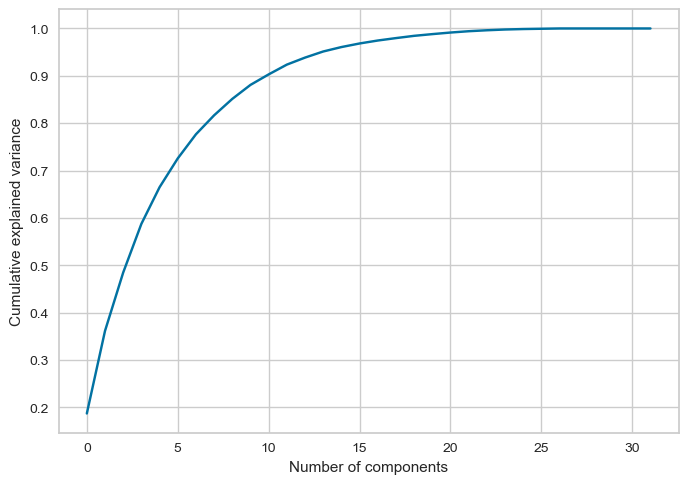

13


In [93]:
plot_pca(df_minmax)

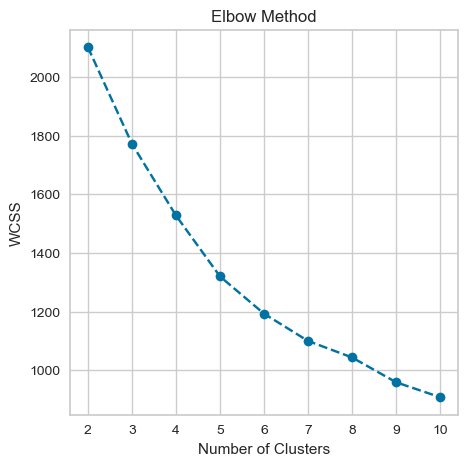

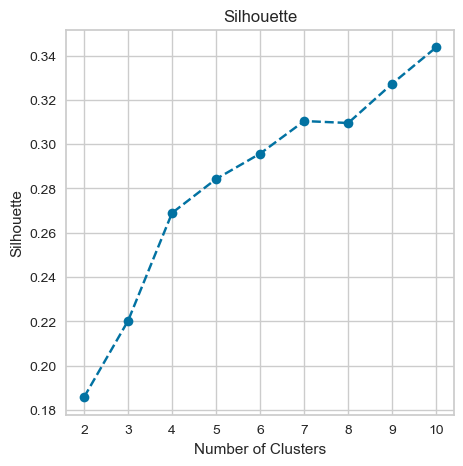

In [94]:
plot_elbow_and_silhouette(df_minmax)

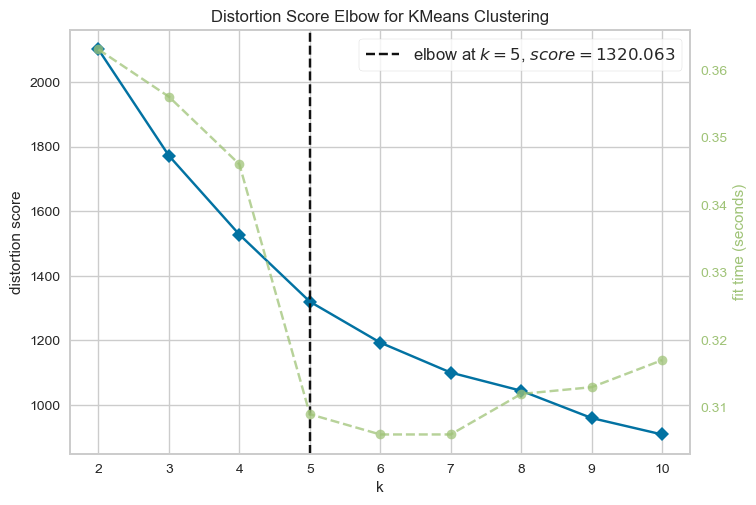

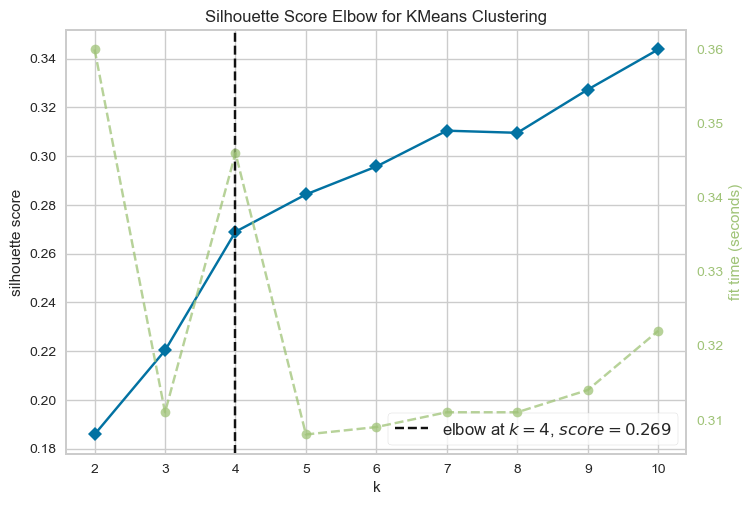

In [95]:
plot_elbow_and_silhouette_yellowbrick(df_minmax)

In [96]:
def plot_feature_importance(df, clusters, centroids=None):
    if centroids is None:
        centroids = df.groupby(clusters).mean()
    
    feature_importance = centroids.std(axis=0)
    plt.figure(figsize=(10, 10))
    plt.barh(df.columns, feature_importance)
    plt.show()

In [97]:
def add_score(df, model, clusters, df_result):
    silhouette = silhouette_score(df, clusters)
    davies_bouldin = davies_bouldin_score(df, clusters)
    calinski_harabaz = calinski_harabasz_score(df, clusters)
    df_result.loc[len(df_result)] =[model, silhouette, davies_bouldin, calinski_harabaz]
    return df_result

In [98]:
df_score = pd.DataFrame(columns=['Model', 'Silhouette score', 'Davies Bouldin score', 'Calinski Harabaz Score'])

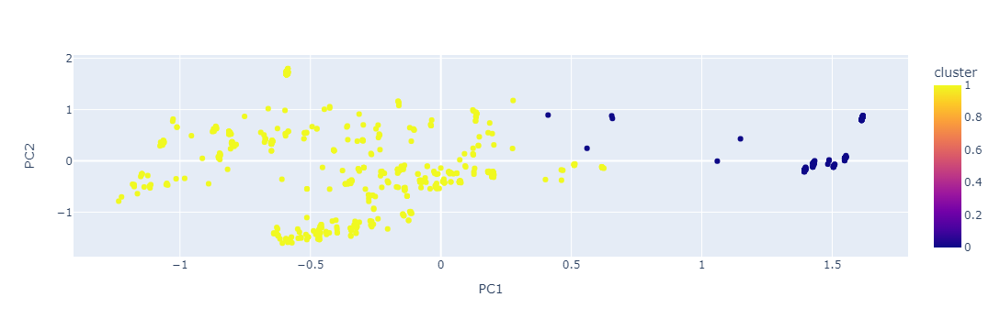

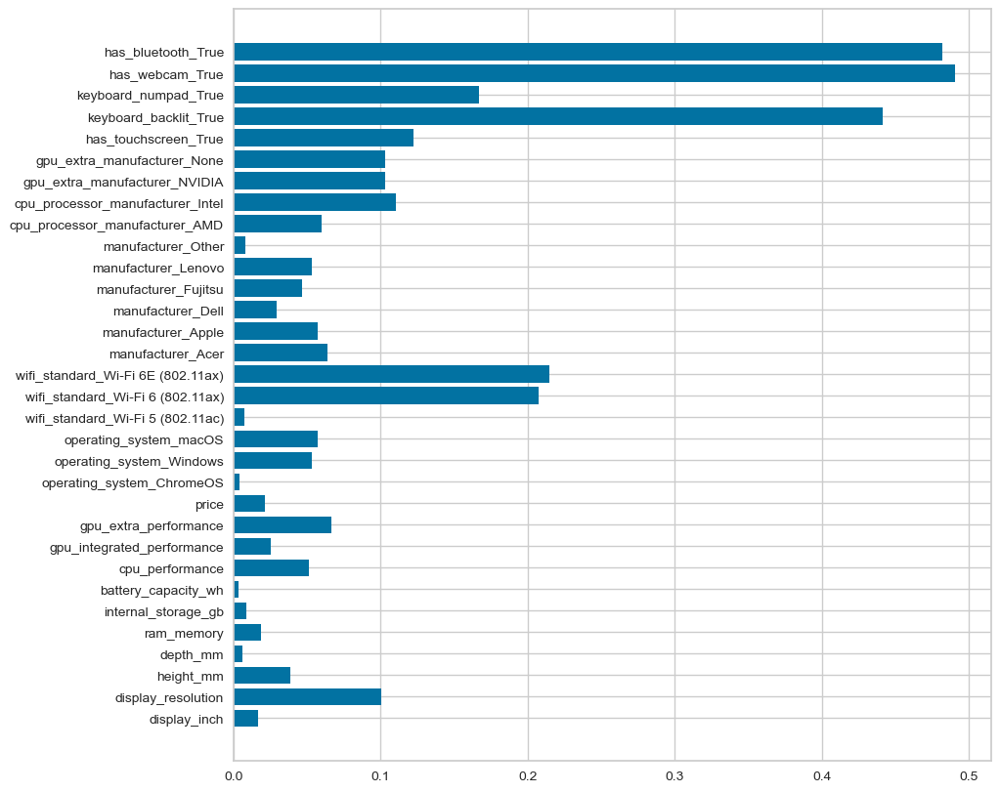

,Model,Silhouette score,Davies Bouldin score,Calinski Harabaz Score
0,Kmeans 2 clusters,0.185799,1.568386,134.915115


In [99]:
kmeans = KMeans(n_clusters=2, random_state=42)
clusters = kmeans.fit_predict(df_minmax)
labels = kmeans.labels_

pca = PCA(n_components=3)
X_pca = pca.fit_transform(df_minmax)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])
df_pca['cluster'] = labels

fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='cluster')
fig.show()

pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_minmax)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
df_pca['cluster'] = labels

fig = px.scatter(df_pca, x='PC1', y='PC2', color='cluster')
fig.show()

plot_feature_importance(df_minmax, clusters,kmeans.cluster_centers_)

add_score(df_minmax, 'Kmeans 2 clusters', clusters, df_score)

In [100]:
df_minmax.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 722 entries, 0 to 721
Data columns (total 32 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   display_inch                       722 non-null    float64
 1   display_resolution                 722 non-null    float64
 2   height_mm                          722 non-null    float64
 3   depth_mm                           722 non-null    float64
 4   ram_memory                         722 non-null    float64
 5   internal_storage_gb                722 non-null    float64
 6   battery_capacity_wh                722 non-null    float64
 7   cpu_performance                    722 non-null    float64
 8   gpu_integrated_performance         722 non-null    float64
 9   gpu_extra_performance              722 non-null    float64
 10  price                              722 non-null    float64
 11  operating_system_ChromeOS          722 non-null    float64

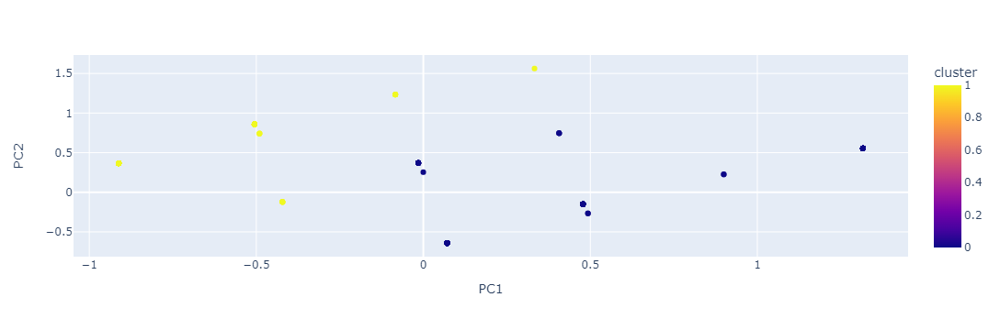

,Model,Silhouette score,Davies Bouldin score,Calinski Harabaz Score
0,Kmeans 2 clusters,0.185799,1.568386,134.915115
1,Kmeans 2 clusters + important columns,0.614257,0.734586,669.657820


In [101]:
df_important_cols = df_minmax[
    ['wifi_standard_Wi-Fi 6 (802.11ax)', 'wifi_standard_Wi-Fi 6E (802.11ax)', 'has_bluetooth_True', 'has_webcam_True', 'keyboard_backlit_True']
]


kmeans = KMeans(n_clusters=2, random_state=42)
clusters = kmeans.fit_predict(df_important_cols)
labels = kmeans.labels_

pca = PCA(n_components=3)
X_pca = pca.fit_transform(df_important_cols)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])
df_pca['cluster'] = labels

fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='cluster')
fig.show()

pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_important_cols)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
df_pca['cluster'] = labels

fig = px.scatter(df_pca, x='PC1', y='PC2', color='cluster')
fig.show()

add_score(df_important_cols, 'Kmeans 2 clusters + important columns', clusters, df_score)

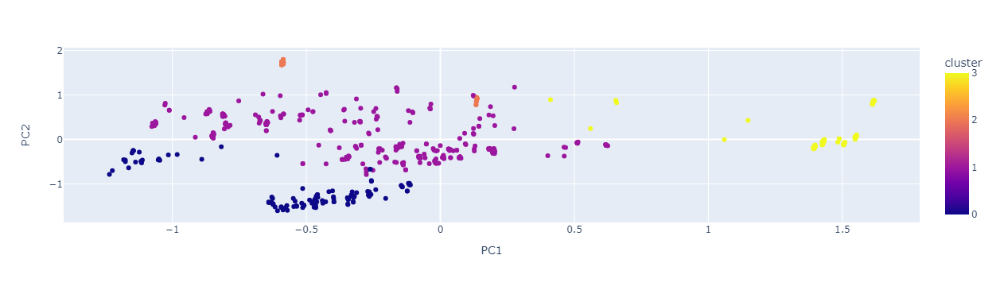

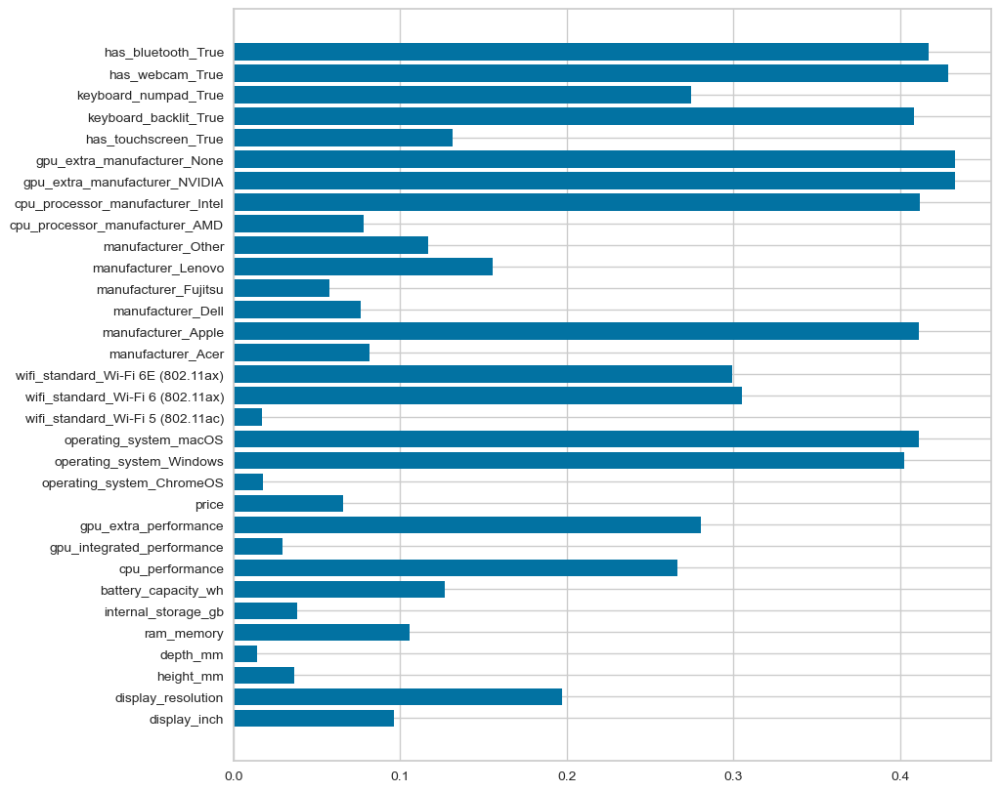

,Model,Silhouette score,Davies Bouldin score,Calinski Harabaz Score
0,Kmeans 2 clusters,0.185799,1.568386,134.915115
1,Kmeans 2 clusters + important columns,0.614257,0.734586,669.657820
2,Kmeans 4 clusters,0.268973,1.450800,151.533661


In [102]:
kmeans = KMeans(n_clusters=4, random_state=42)
clusters = kmeans.fit_predict(df_minmax)
labels = kmeans.labels_


pca = PCA(n_components=3)
X_pca = pca.fit_transform(df_minmax)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])
df_pca['cluster'] = labels

fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='cluster')
fig.show()

pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_minmax)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
df_pca['cluster'] = labels

fig = px.scatter(df_pca, x='PC1', y='PC2', color='cluster')
fig.show()

plot_feature_importance(df_minmax, clusters,kmeans.cluster_centers_)

add_score(df_minmax, 'Kmeans 4 clusters', clusters, df_score)

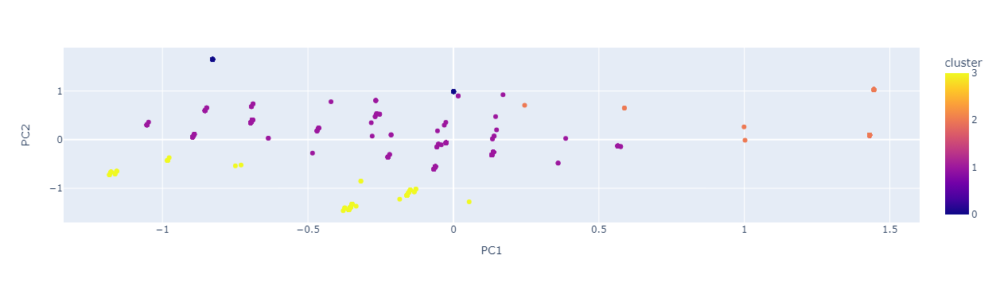

,Model,Silhouette score,Davies Bouldin score,Calinski Harabaz Score
0,Kmeans 2 clusters,0.185799,1.568386,134.915115
1,Kmeans 2 clusters + important columns,0.614257,0.734586,669.657820
2,Kmeans 4 clusters,0.268973,1.450800,151.533661
3,Kmeans 4 clusters + important columns,0.461108,0.956535,329.660996


In [103]:
df_important_cols = df_minmax[[
    'has_bluetooth_True', 'has_webcam_True', 'keyboard_numpad_True', 'keyboard_backlit_True',
    'gpu_extra_manufacturer_None', 'gpu_extra_manufacturer_NVIDIA', 
    'cpu_processor_manufacturer_Intel',
    'manufacturer_Apple', 'wifi_standard_Wi-Fi 6 (802.11ax)', 'wifi_standard_Wi-Fi 6E (802.11ax)', 
    'operating_system_macOS', 'operating_system_Windows',  
    'cpu_performance', 'gpu_extra_performance'
]]


kmeans = KMeans(n_clusters=4, random_state=42)
clusters = kmeans.fit_predict(df_important_cols)
labels = kmeans.labels_

pca = PCA(n_components=3)
X_pca = pca.fit_transform(df_important_cols)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])
df_pca['cluster'] = labels

fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='cluster')
fig.show()

pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_important_cols)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
df_pca['cluster'] = labels

fig = px.scatter(df_pca, x='PC1', y='PC2', color='cluster')
fig.show()

add_score(df_important_cols, 'Kmeans 4 clusters + important columns', clusters, df_score)

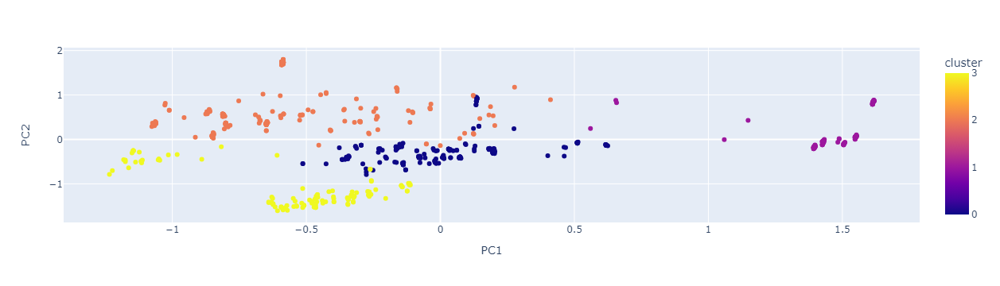

,Model,Silhouette score,Davies Bouldin score,Calinski Harabaz Score
0,Kmeans 2 clusters,0.185799,1.568386,134.915115
1,Kmeans 2 clusters + important columns,0.614257,0.734586,669.657820
2,Kmeans 4 clusters,0.268973,1.450800,151.533661
3,Kmeans 4 clusters + important columns,0.461108,0.956535,329.660996
4,Kmeans 4 clusters + PCA,0.259952,1.670633,168.050278


In [104]:
pca = PCA(n_components=12)
X_pca_minmax = pca.fit_transform(df_minmax)

kmeans = KMeans(n_clusters=4, random_state=42)
clusters = kmeans.fit_predict(X_pca_minmax)
labels = kmeans.labels_

pca = PCA(n_components=3)
X_pca = pca.fit_transform(X_pca_minmax)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])
df_pca['cluster'] = labels

fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='cluster')
fig.show()

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_pca_minmax)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
df_pca['cluster'] = labels

fig = px.scatter(df_pca, x='PC1', y='PC2', color='cluster')
fig.show()

add_score(X_pca_minmax, 'Kmeans 4 clusters + PCA', clusters, df_score)

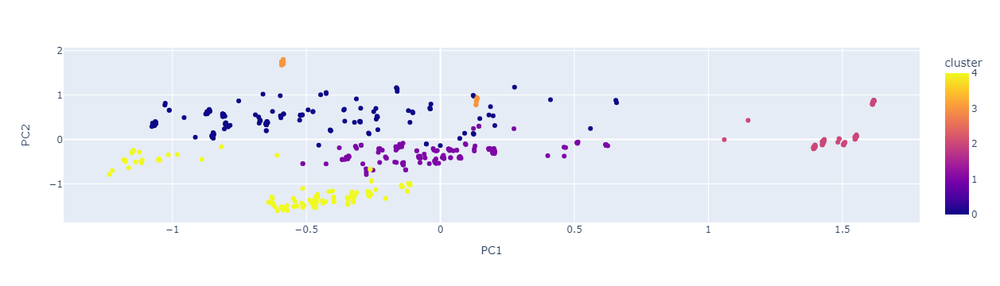

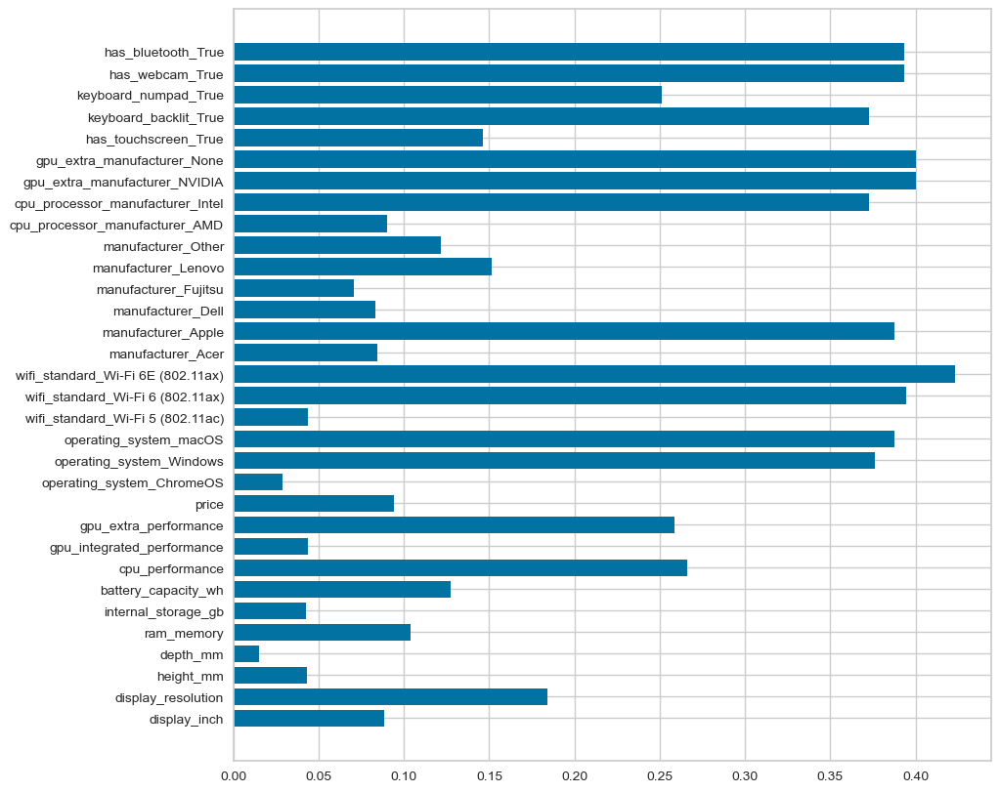

,Model,Silhouette score,Davies Bouldin score,Calinski Harabaz Score
0,Kmeans 2 clusters,0.185799,1.568386,134.915115
1,Kmeans 2 clusters + important columns,0.614257,0.734586,669.657820
2,Kmeans 4 clusters,0.268973,1.450800,151.533661
3,Kmeans 4 clusters + important columns,0.461108,0.956535,329.660996
4,Kmeans 4 clusters + PCA,0.259952,1.670633,168.050278
5,Kmeans 5 clusters,0.284286,1.564689,159.562924


In [105]:
kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(df_minmax)
labels = kmeans.labels_


pca = PCA(n_components=3)
X_pca = pca.fit_transform(df_minmax)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])
df_pca['cluster'] = labels

fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='cluster')
fig.show()

pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_minmax)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
df_pca['cluster'] = labels

fig = px.scatter(df_pca, x='PC1', y='PC2', color='cluster')
fig.show()

plot_feature_importance(df_minmax, clusters,kmeans.cluster_centers_)

add_score(df_minmax, 'Kmeans 5 clusters', clusters, df_score)

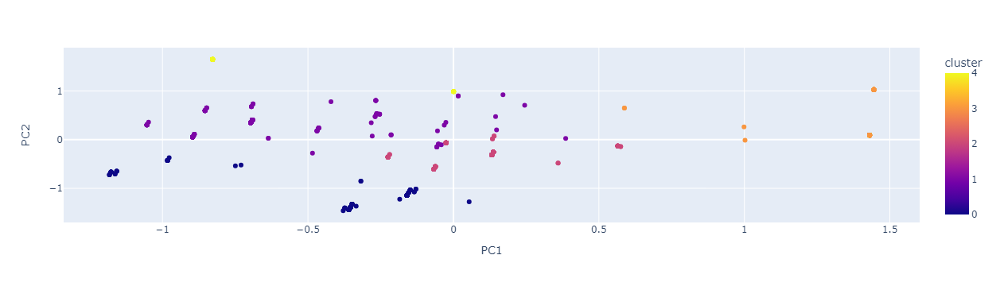

,Model,Silhouette score,Davies Bouldin score,Calinski Harabaz Score
0,Kmeans 2 clusters,0.185799,1.568386,134.915115
1,Kmeans 2 clusters + important columns,0.614257,0.734586,669.657820
2,Kmeans 4 clusters,0.268973,1.450800,151.533661
3,Kmeans 4 clusters + important columns,0.461108,0.956535,329.660996
4,Kmeans 4 clusters + PCA,0.259952,1.670633,168.050278
5,Kmeans 5 clusters,0.284286,1.564689,159.562924
6,Kmeans 5 clusters + important columns,0.506381,0.892005,420.964498


In [106]:
df_important_cols = df_minmax[[
    'has_bluetooth_True', 'has_webcam_True', 'keyboard_numpad_True', 'keyboard_backlit_True',
    'gpu_extra_manufacturer_None', 'gpu_extra_manufacturer_NVIDIA', 
    'cpu_processor_manufacturer_Intel',
    'manufacturer_Apple', 'wifi_standard_Wi-Fi 6 (802.11ax)', 'wifi_standard_Wi-Fi 6E (802.11ax)', 
    'operating_system_macOS', 'operating_system_Windows',  
    'cpu_performance', 'gpu_extra_performance'
]]


kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(df_important_cols)
labels = kmeans.labels_

pca = PCA(n_components=3)
X_pca = pca.fit_transform(df_important_cols)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])
df_pca['cluster'] = labels

fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='cluster')
fig.show()

pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_important_cols)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
df_pca['cluster'] = labels

fig = px.scatter(df_pca, x='PC1', y='PC2', color='cluster')
fig.show()

add_score(df_important_cols, 'Kmeans 5 clusters + important columns', clusters, df_score)

In [107]:
df_minmax.shape

(722, 32)

In [108]:
def silhouette_scorer(estimator, X):
    labels = estimator.fit_predict(X)

    core_samples_mask = labels != -1
    if len(set(labels[core_samples_mask])) > 1:
        score = silhouette_score(X[core_samples_mask], labels[core_samples_mask])
    else:
        score = -1  
    return score

In [109]:
def calinski_harabasz_scorer(estimator, X):
    labels = estimator.fit_predict(X)
    
    core_samples_mask = labels != -1
    if len(set(labels[core_samples_mask])) > 1:
        score = calinski_harabasz_score(X[core_samples_mask], labels[core_samples_mask])
    else:
        score = -1
    return score

In [110]:
def davies_bouldin_scorer(estimator, X):
    labels = estimator.fit_predict(X)

    core_samples_mask = labels != -1
    if len(set(labels[core_samples_mask])) > 1:
        score = davies_bouldin_score(X[core_samples_mask], labels[core_samples_mask])
    else:
        score = float('inf')
    return score

In [111]:
#https://medium.com/@tarammullin/dbscan-parameter-estimation-ff8330e3a3bd

dbscan_param_grid = {
    'eps': [0.1, 0.2, 0.4, 0.5, 1, 2, 3],
    'min_samples': [2, 3, 5, 10, 15, 20, 29, 58],
}

scorer = make_scorer(silhouette_scorer)
dbscan = DBSCAN()
dbscan_cv = GridSearchCV(dbscan, dbscan_param_grid, scoring=scorer)
dbscan_cv.fit(df_minmax)
print(dbscan_cv.best_params_)

scorer = make_scorer(calinski_harabasz_scorer)
dbscan = DBSCAN()
dbscan_cv = GridSearchCV(dbscan, dbscan_param_grid, scoring=scorer)
dbscan_cv.fit(df_minmax)
print(dbscan_cv.best_params_)

scorer = make_scorer(davies_bouldin_scorer)
dbscan = DBSCAN()
dbscan_cv = GridSearchCV(dbscan, dbscan_param_grid, scoring=scorer)
dbscan_cv.fit(df_minmax)
print(dbscan_cv.best_params_)

{'eps': 0.1, 'min_samples': 2}
{'eps': 0.1, 'min_samples': 2}
{'eps': 0.1, 'min_samples': 2}


Clusters:120


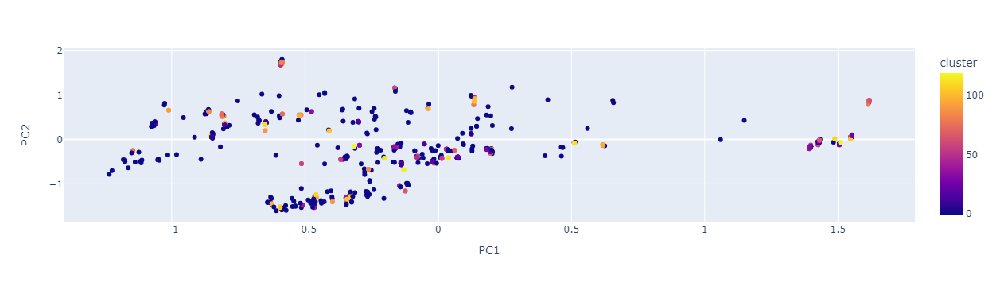

,Model,Silhouette score,Davies Bouldin score,Calinski Harabaz Score
0,Kmeans 2 clusters,0.185799,1.568386,134.915115
1,Kmeans 2 clusters + important columns,0.614257,0.734586,669.657820
2,Kmeans 4 clusters,0.268973,1.450800,151.533661
3,Kmeans 4 clusters + important columns,0.461108,0.956535,329.660996
4,Kmeans 4 clusters + PCA,0.259952,1.670633,168.050278
5,Kmeans 5 clusters,0.284286,1.564689,159.562924
6,Kmeans 5 clusters + important columns,0.506381,0.892005,420.964498
7,DBSCAN,0.291991,1.006122,9.526435


In [112]:
dbscan = DBSCAN(eps=0.1, min_samples=2)
clusters = dbscan.fit_predict(df_minmax)
print(f'Clusters:{len(np.unique(clusters)) - 1}')

pca = PCA(n_components=3)
X_pca = pca.fit_transform(df_minmax)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])
df_pca['cluster'] = clusters

fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='cluster')
fig.show()

pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_minmax)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
df_pca['cluster'] = clusters

fig = px.scatter(df_pca, x='PC1', y='PC2', color='cluster')
fig.show()

add_score(X_pca_minmax, 'DBSCAN', clusters, df_score)

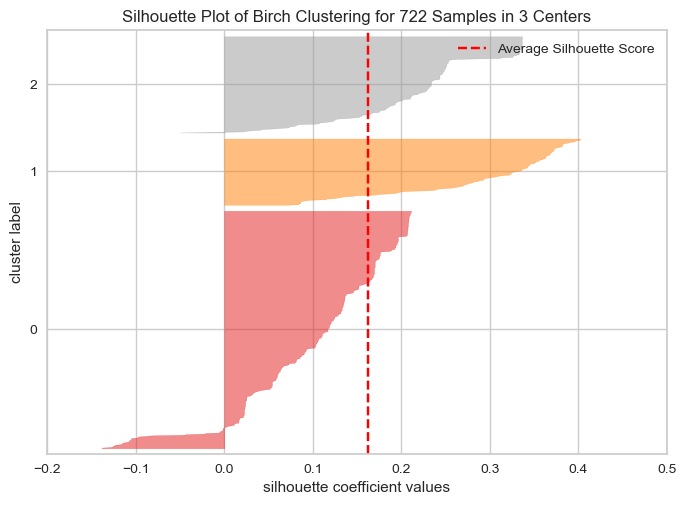

In [113]:
plot_silhouette_yellowbrick(df_minmax, Birch())

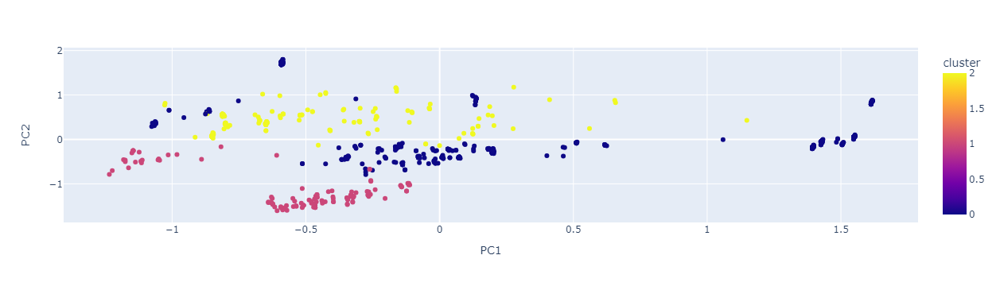

,Model,Silhouette score,Davies Bouldin score,Calinski Harabaz Score
0,Kmeans 2 clusters,0.185799,1.568386,134.915115
1,Kmeans 2 clusters + important columns,0.614257,0.734586,669.657820
2,Kmeans 4 clusters,0.268973,1.450800,151.533661
3,Kmeans 4 clusters + important columns,0.461108,0.956535,329.660996
4,Kmeans 4 clusters + PCA,0.259952,1.670633,168.050278
5,Kmeans 5 clusters,0.284286,1.564689,159.562924
6,Kmeans 5 clusters + important columns,0.506381,0.892005,420.964498
7,DBSCAN,0.291991,1.006122,9.526435
8,Birch 3 clusters,0.161909,2.182100,101.293871


In [114]:
#pca = PCA(n_components=12)
#X_pca_minmax = pca.fit_transform(df_minmax)

birch = Birch(n_clusters=3)
clusters = birch.fit_predict(df_minmax)

pca = PCA(n_components=3)
X_pca = pca.fit_transform(df_minmax)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])
df_pca['cluster'] = clusters

fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='cluster')
fig.show()

pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_minmax)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
df_pca['cluster'] = clusters

fig = px.scatter(df_pca, x='PC1', y='PC2', color='cluster')
fig.show()

#plot_feature_importance(df_minmax, clusters,birch.cluster_centers_)

add_score(df_minmax, 'Birch 3 clusters', clusters, df_score)

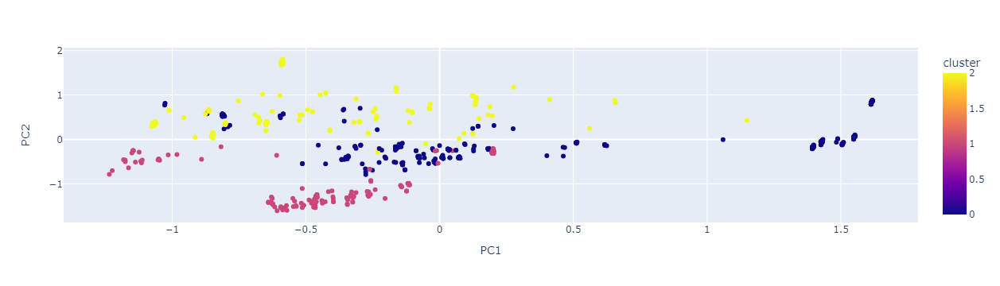

,Model,Silhouette score,Davies Bouldin score,Calinski Harabaz Score
0,Kmeans 2 clusters,0.185799,1.568386,134.915115
1,Kmeans 2 clusters + important columns,0.614257,0.734586,669.657820
2,Kmeans 4 clusters,0.268973,1.450800,151.533661
3,Kmeans 4 clusters + important columns,0.461108,0.956535,329.660996
4,Kmeans 4 clusters + PCA,0.259952,1.670633,168.050278
5,Kmeans 5 clusters,0.284286,1.564689,159.562924
6,Kmeans 5 clusters + important columns,0.506381,0.892005,420.964498
7,DBSCAN,0.291991,1.006122,9.526435
8,Birch 3 clusters,0.161909,2.182100,101.293871
9,Birch 3 clusters + PCA,0.154455,2.317979,96.419210


In [115]:
pca = PCA(n_components=12)
X_pca_minmax = pca.fit_transform(df_minmax)

birch = Birch(n_clusters=3)
clusters = birch.fit_predict(X_pca_minmax)

pca = PCA(n_components=3)
X_pca = pca.fit_transform(df_minmax)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])
df_pca['cluster'] = clusters

fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='cluster')
fig.show()

pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_minmax)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
df_pca['cluster'] = clusters

fig = px.scatter(df_pca, x='PC1', y='PC2', color='cluster')
fig.show()

add_score(df_minmax, 'Birch 3 clusters + PCA', clusters, df_score)

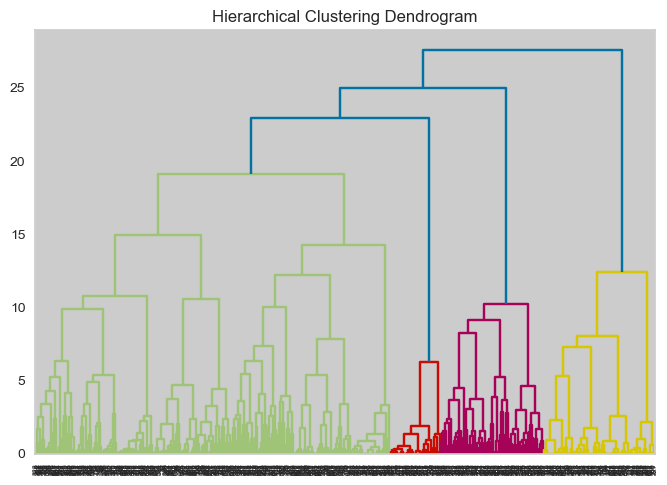

In [116]:
linked = linkage(df_minmax, 'ward')
dendrogram(linked, orientation='top', distance_sort='descending', show_leaf_counts=True)
plt.title('Hierarchical Clustering Dendrogram')
plt.show()

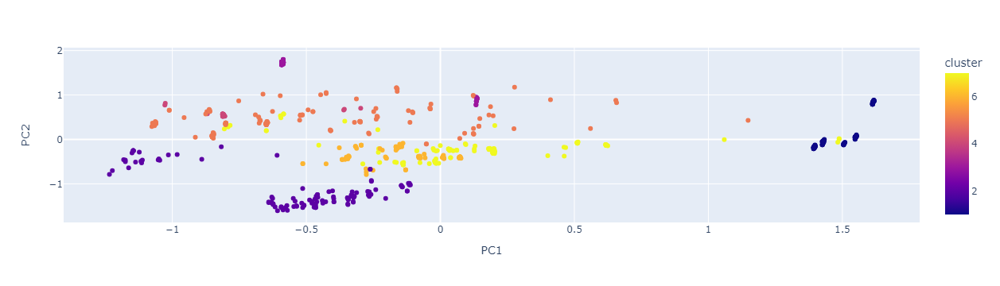

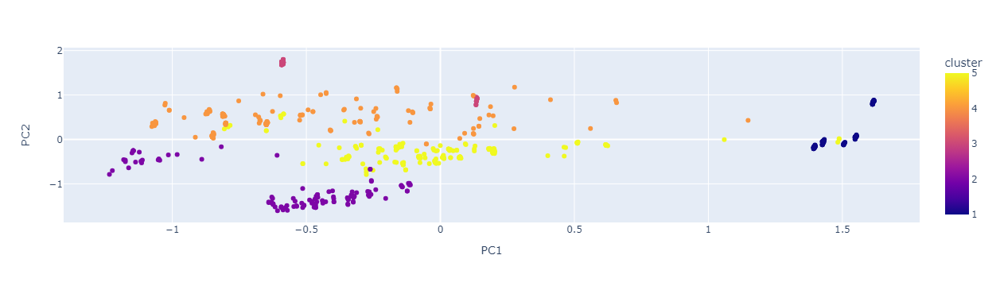

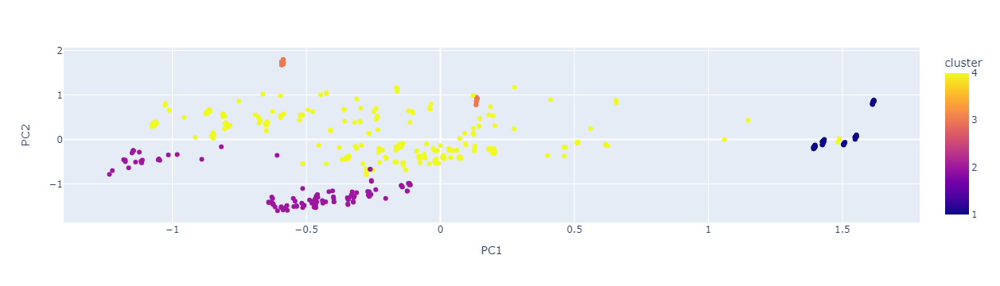

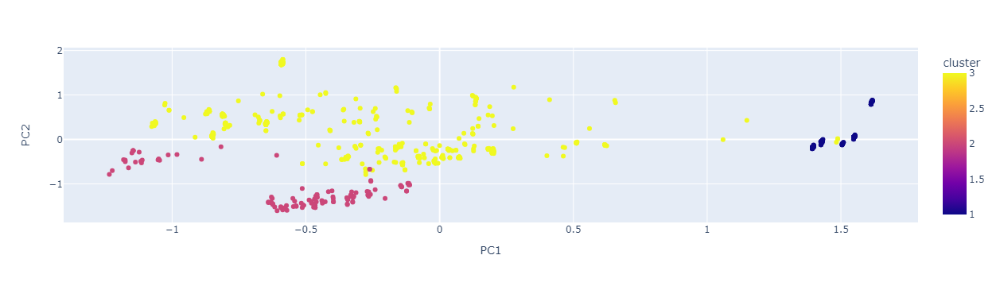

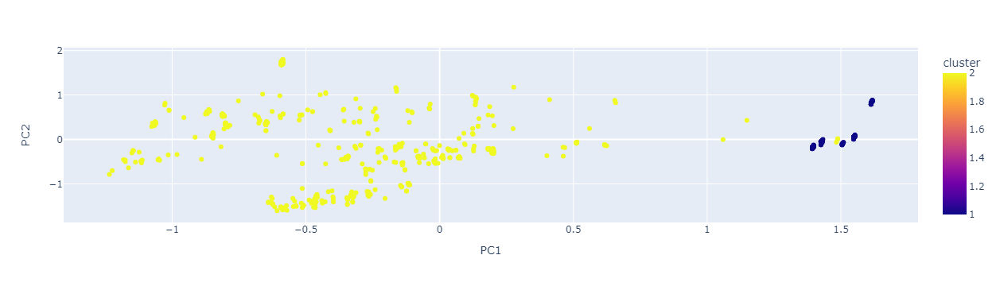

In [117]:
for height in [14, 15,22, 24, 27]:
    clusters = fcluster(linked, height, criterion='distance')

    pca = PCA(n_components=3)
    X_pca = pca.fit_transform(df_minmax)

    df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])
    df_pca['cluster'] = clusters

    fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='cluster')
    fig.show()

    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(df_minmax)

    df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
    df_pca['cluster'] = clusters

    fig = px.scatter(df_pca, x='PC1', y='PC2', color='cluster')
    fig.show()

    add_score(df_minmax, f'Cut at {height}, {len(np.unique(clusters))} clusters', clusters, df_score)

In [118]:
df_score

,Model,Silhouette score,Davies Bouldin score,Calinski Harabaz Score
0,Kmeans 2 clusters,0.185799,1.568386,134.915115
1,Kmeans 2 clusters + important columns,0.614257,0.734586,669.657820
2,Kmeans 4 clusters,0.268973,1.450800,151.533661
3,Kmeans 4 clusters + important columns,0.461108,0.956535,329.660996
4,Kmeans 4 clusters + PCA,0.259952,1.670633,168.050278
5,Kmeans 5 clusters,0.284286,1.564689,159.562924
6,Kmeans 5 clusters + important columns,0.506381,0.892005,420.964498
7,DBSCAN,0.291991,1.006122,9.526435
8,Birch 3 clusters,0.161909,2.182100,101.293871
9,Birch 3 clusters + PCA,0.154455,2.317979,96.419210


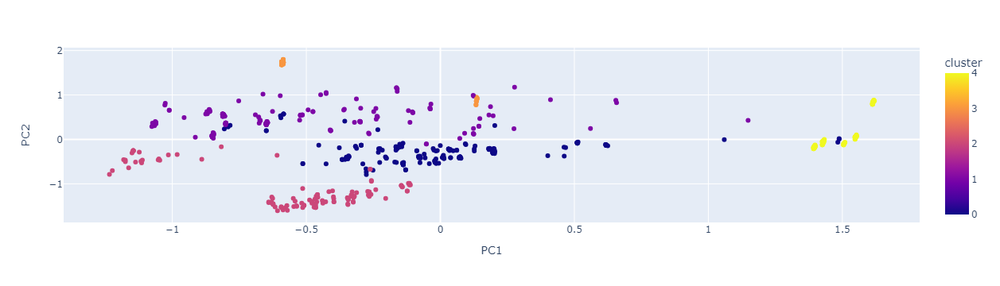

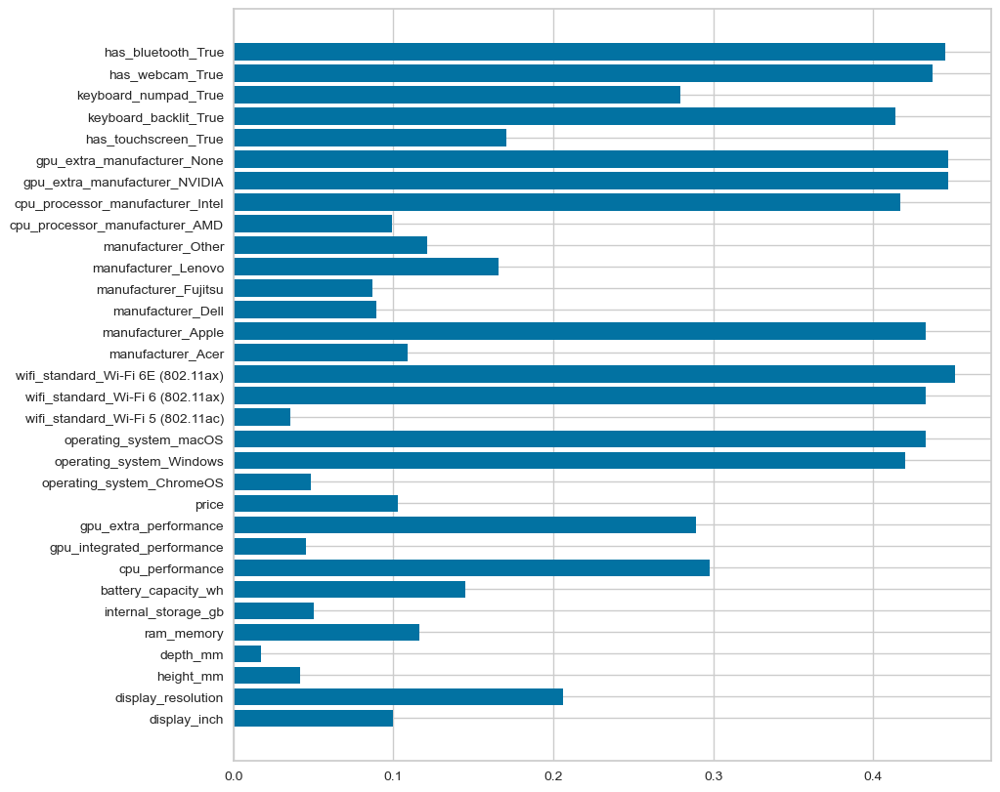

,Model,Silhouette score,Davies Bouldin score,Calinski Harabaz Score
0,Kmeans 2 clusters,0.185799,1.568386,134.915115
1,Kmeans 2 clusters + important columns,0.614257,0.734586,669.657820
2,Kmeans 4 clusters,0.268973,1.450800,151.533661
3,Kmeans 4 clusters + important columns,0.461108,0.956535,329.660996
4,Kmeans 4 clusters + PCA,0.259952,1.670633,168.050278
5,Kmeans 5 clusters,0.284286,1.564689,159.562924
6,Kmeans 5 clusters + important columns,0.506381,0.892005,420.964498
7,DBSCAN,0.291991,1.006122,9.526435
8,Birch 3 clusters,0.161909,2.182100,101.293871
9,Birch 3 clusters + PCA,0.154455,2.317979,96.419210


In [119]:
agglomerative_clustering = AgglomerativeClustering(n_clusters=5)
clusters = agglomerative_clustering.fit_predict(df_minmax)

pca = PCA(n_components=3)
X_pca = pca.fit_transform(df_minmax)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])
df_pca['cluster'] = clusters

fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='cluster')
fig.show()

pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_minmax)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
df_pca['cluster'] = clusters

fig = px.scatter(df_pca, x='PC1', y='PC2', color='cluster')
fig.show()

plot_feature_importance(df_minmax, clusters)

add_score(df_minmax, f'Agglomerative 5 clusters', clusters, df_score)

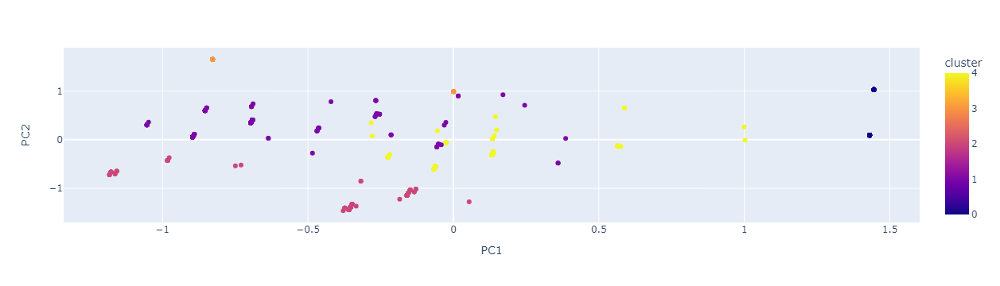

,Model,Silhouette score,Davies Bouldin score,Calinski Harabaz Score
0,Kmeans 2 clusters,0.185799,1.568386,134.915115
1,Kmeans 2 clusters + important columns,0.614257,0.734586,669.657820
2,Kmeans 4 clusters,0.268973,1.450800,151.533661
3,Kmeans 4 clusters + important columns,0.461108,0.956535,329.660996
4,Kmeans 4 clusters + PCA,0.259952,1.670633,168.050278
5,Kmeans 5 clusters,0.284286,1.564689,159.562924
6,Kmeans 5 clusters + important columns,0.506381,0.892005,420.964498
7,DBSCAN,0.291991,1.006122,9.526435
8,Birch 3 clusters,0.161909,2.182100,101.293871
9,Birch 3 clusters + PCA,0.154455,2.317979,96.419210


In [120]:
df_important_cols = df_minmax[[
    'has_bluetooth_True', 'has_webcam_True', 'keyboard_numpad_True', 'keyboard_backlit_True',
    'gpu_extra_manufacturer_None', 'gpu_extra_manufacturer_NVIDIA', 
    'cpu_processor_manufacturer_Intel', 'manufacturer_Apple', 
    'wifi_standard_Wi-Fi 6 (802.11ax)', 'wifi_standard_Wi-Fi 6E (802.11ax)', 
    'operating_system_macOS', 'operating_system_Windows',
    'gpu_extra_performance', 'cpu_performance'
]]

agglomerative_clustering = AgglomerativeClustering(n_clusters=5)
clusters = agglomerative_clustering.fit_predict(df_important_cols)

pca = PCA(n_components=3)
X_pca = pca.fit_transform(df_important_cols)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])
df_pca['cluster'] = clusters

fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='cluster')
fig.show()

pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_important_cols)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
df_pca['cluster'] = clusters

fig = px.scatter(df_pca, x='PC1', y='PC2', color='cluster')
fig.show()

add_score(df_important_cols, f'Agglomerative 5 clusters + important columns', clusters, df_score)

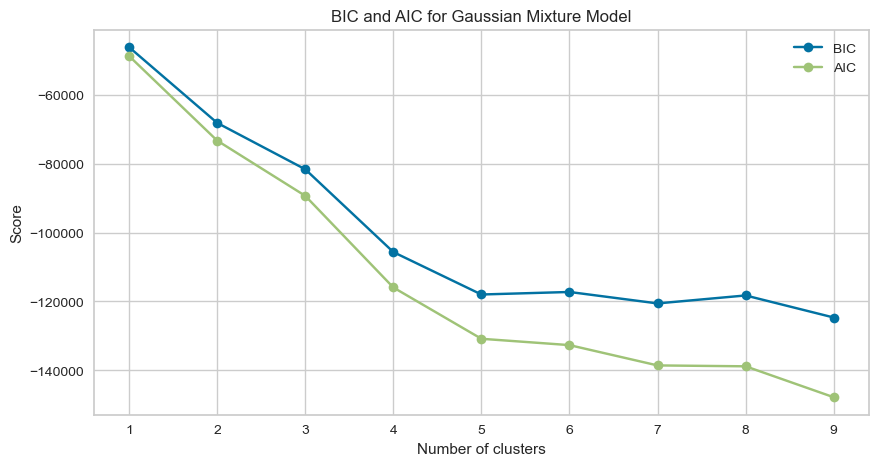

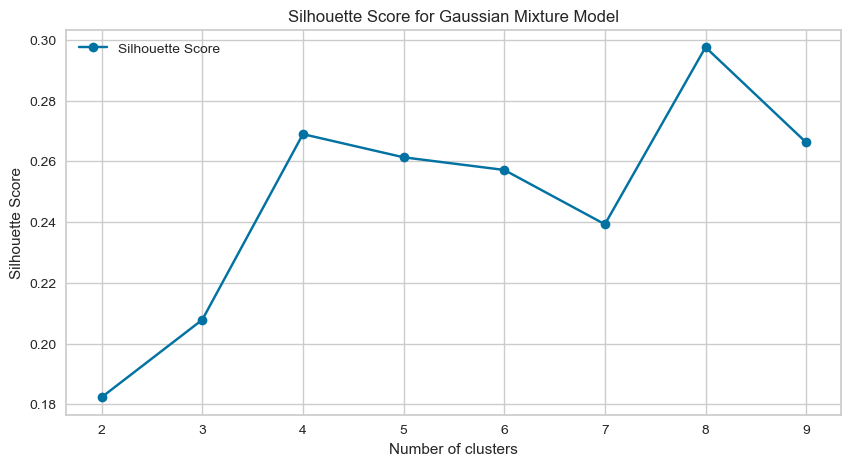

Best number of clusters based on BIC: 9
Best number of clusters based on AIC: 9
Best number of clusters based on Silhouette Score: 8


In [121]:
range_n_clusters = range(1, 10)

bic_scores = []
aic_scores = []
silhouette_scores = []

for n_clusters in range_n_clusters:
    gmm = GaussianMixture(n_components=n_clusters, random_state=42)
    gmm.fit(df_minmax)
    
    bic_scores.append(gmm.bic(df_minmax))
    aic_scores.append(gmm.aic(df_minmax))
    
    if n_clusters > 1:
        cluster_labels = gmm.predict(df_minmax)
        
        silhouette_avg = silhouette_score(df_minmax, cluster_labels)
        silhouette_scores.append(silhouette_avg)
    else:
        silhouette_scores.append(None)

plt.figure(figsize=(10, 5))
plt.plot(range_n_clusters, bic_scores, label='BIC', marker='o')
plt.plot(range_n_clusters, aic_scores, label='AIC', marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Score')
plt.title('BIC and AIC for Gaussian Mixture Model')
plt.legend()
plt.show()

plt.figure(figsize=(10, 5))
plt.plot(range(2, 10), silhouette_scores[1:], label='Silhouette Score', marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score for Gaussian Mixture Model')
plt.legend()
plt.show()

best_n_clusters_bic = np.argmin(bic_scores) + 1
print(f'Best number of clusters based on BIC: {best_n_clusters_bic}')

best_n_clusters_aic = np.argmin(aic_scores) + 1
print(f'Best number of clusters based on AIC: {best_n_clusters_aic}')

best_n_clusters_silhouette = np.argmax(silhouette_scores[1:]) + 2
print(f'Best number of clusters based on Silhouette Score: {best_n_clusters_silhouette}')

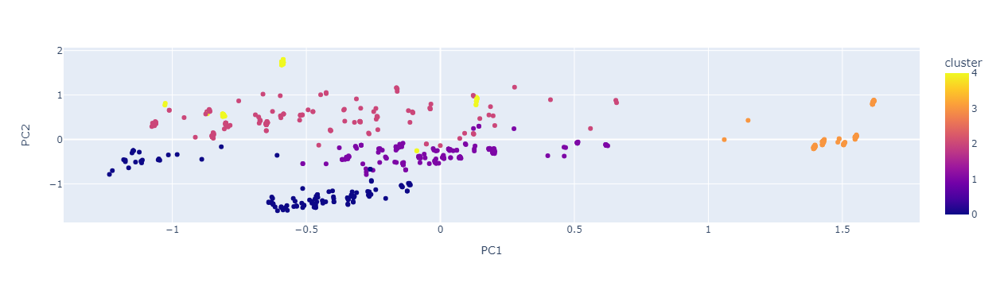

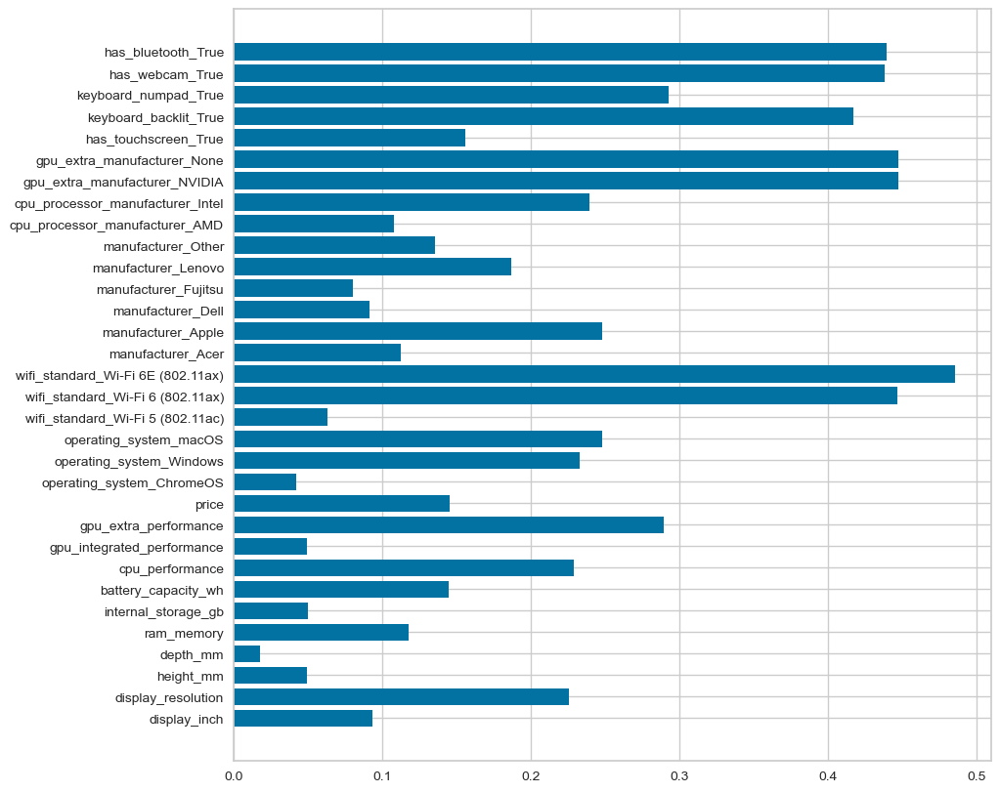

,Model,Silhouette score,Davies Bouldin score,Calinski Harabaz Score
0,Kmeans 2 clusters,0.185799,1.568386,134.915115
1,Kmeans 2 clusters + important columns,0.614257,0.734586,669.657820
2,Kmeans 4 clusters,0.268973,1.450800,151.533661
3,Kmeans 4 clusters + important columns,0.461108,0.956535,329.660996
4,Kmeans 4 clusters + PCA,0.259952,1.670633,168.050278
5,Kmeans 5 clusters,0.284286,1.564689,159.562924
6,Kmeans 5 clusters + important columns,0.506381,0.892005,420.964498
7,DBSCAN,0.291991,1.006122,9.526435
8,Birch 3 clusters,0.161909,2.182100,101.293871
9,Birch 3 clusters + PCA,0.154455,2.317979,96.419210


In [122]:
gmm = GaussianMixture(n_components=5, random_state=42)
clusters = gmm.fit_predict(df_minmax)

pca = PCA(n_components=3)
X_pca = pca.fit_transform(df_minmax)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])
df_pca['cluster'] = clusters

fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='cluster')
fig.show()

pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_minmax)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
df_pca['cluster'] = clusters

fig = px.scatter(df_pca, x='PC1', y='PC2', color='cluster')
fig.show()

plot_feature_importance(df_minmax, clusters)

add_score(df_minmax, f'Gaussian mixture 5 clusters', clusters, df_score)

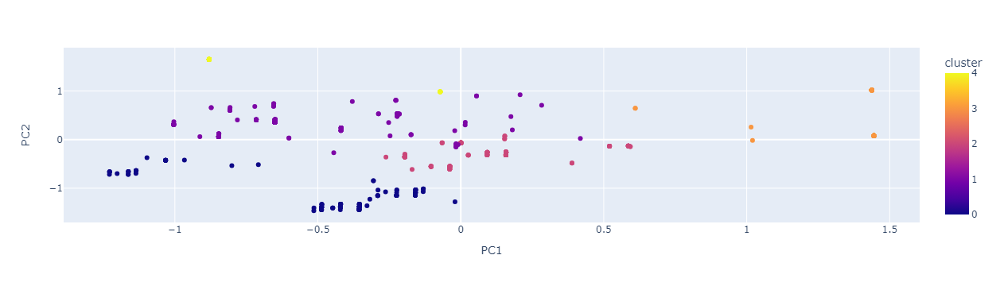

,Model,Silhouette score,Davies Bouldin score,Calinski Harabaz Score
0,Kmeans 2 clusters,0.185799,1.568386,134.915115
1,Kmeans 2 clusters + important columns,0.614257,0.734586,669.657820
2,Kmeans 4 clusters,0.268973,1.450800,151.533661
3,Kmeans 4 clusters + important columns,0.461108,0.956535,329.660996
4,Kmeans 4 clusters + PCA,0.259952,1.670633,168.050278
5,Kmeans 5 clusters,0.284286,1.564689,159.562924
6,Kmeans 5 clusters + important columns,0.506381,0.892005,420.964498
7,DBSCAN,0.291991,1.006122,9.526435
8,Birch 3 clusters,0.161909,2.182100,101.293871
9,Birch 3 clusters + PCA,0.154455,2.317979,96.419210


In [123]:
df_important_cols = df_minmax[[
    'has_bluetooth_True', 'has_webcam_True', 'keyboard_numpad_True', 'keyboard_backlit_True',
    'gpu_extra_manufacturer_None', 'gpu_extra_manufacturer_NVIDIA', 
    'cpu_processor_manufacturer_Intel',
    'manufacturer_Apple', 'wifi_standard_Wi-Fi 6 (802.11ax)', 'wifi_standard_Wi-Fi 6E (802.11ax)', 
    'operating_system_macOS', 'operating_system_Windows',  
    'cpu_performance', 'gpu_extra_performance', 'display_resolution'
]]

gmm = GaussianMixture(n_components=5, random_state=42)
clusters = gmm.fit_predict(df_important_cols)

pca = PCA(n_components=3)
X_pca = pca.fit_transform(df_important_cols)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])
df_pca['cluster'] = clusters

fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='cluster')
fig.show()

pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_important_cols)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
df_pca['cluster'] = clusters

fig = px.scatter(df_pca, x='PC1', y='PC2', color='cluster')
fig.show()

add_score(df_important_cols, f'Gaussian mixture 5 clusters + important columns', clusters, df_score)

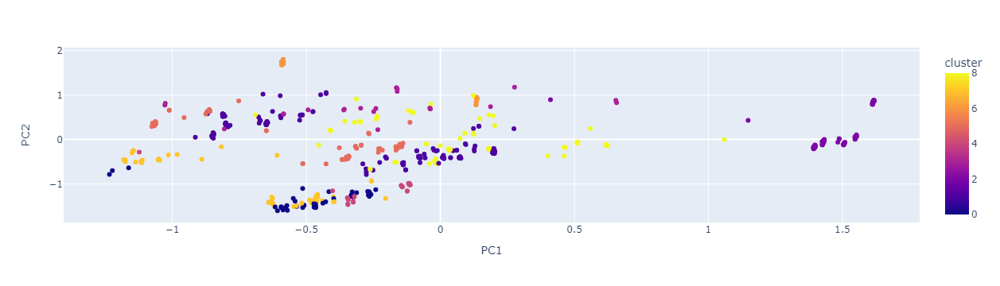

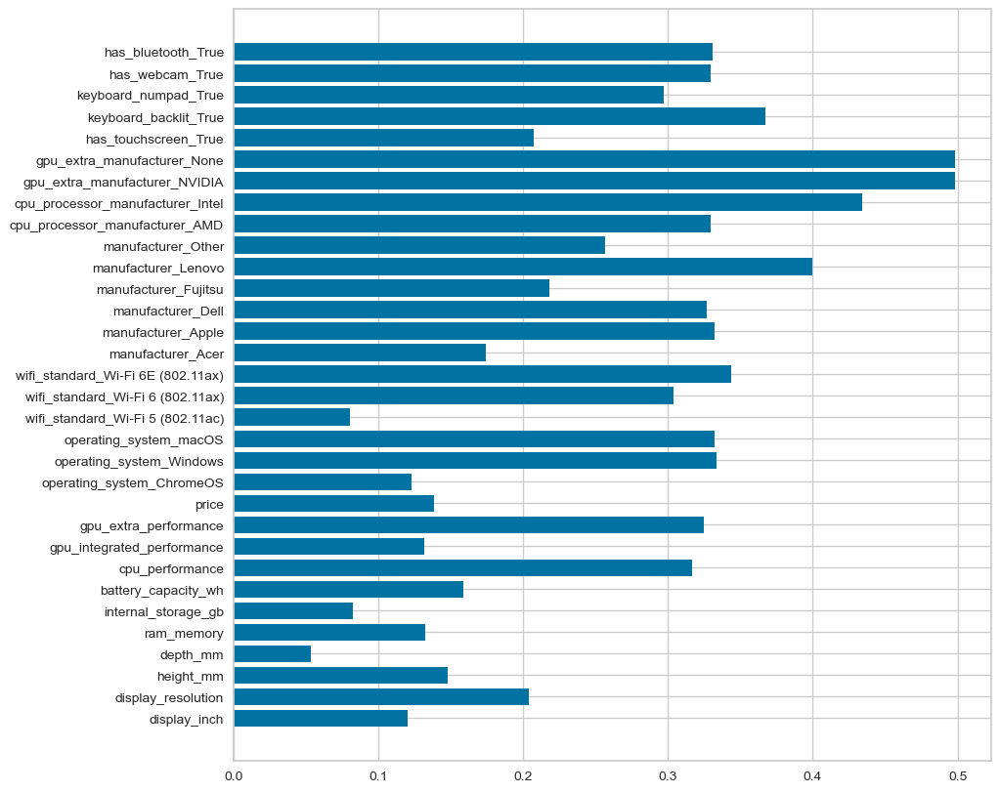

,Model,Silhouette score,Davies Bouldin score,Calinski Harabaz Score
0,Kmeans 2 clusters,0.185799,1.568386,134.915115
1,Kmeans 2 clusters + important columns,0.614257,0.734586,669.657820
2,Kmeans 4 clusters,0.268973,1.450800,151.533661
3,Kmeans 4 clusters + important columns,0.461108,0.956535,329.660996
4,Kmeans 4 clusters + PCA,0.259952,1.670633,168.050278
5,Kmeans 5 clusters,0.284286,1.564689,159.562924
6,Kmeans 5 clusters + important columns,0.506381,0.892005,420.964498
7,DBSCAN,0.291991,1.006122,9.526435
8,Birch 3 clusters,0.161909,2.182100,101.293871
9,Birch 3 clusters + PCA,0.154455,2.317979,96.419210


In [124]:
gmm = GaussianMixture(n_components=9, random_state=42)
clusters = gmm.fit_predict(df_minmax)

pca = PCA(n_components=3)
X_pca = pca.fit_transform(df_minmax)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])
df_pca['cluster'] = clusters

fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='cluster')
fig.show()

pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_minmax)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
df_pca['cluster'] = clusters

fig = px.scatter(df_pca, x='PC1', y='PC2', color='cluster')
fig.show()

plot_feature_importance(df_minmax, clusters)

add_score(df_minmax, f'Gaussian mixture 9 clusters', clusters, df_score)

In [125]:
# df_score_nt = pd.DataFrame(columns=['Model', 'Silhouette score', 'Davies Bouldin score', 'Calinski Harabaz Score'])

In [126]:
# plot_pca_3d(df_no_transformations_minmax)

In [127]:
# plot_pca(df_no_transformations_minmax)

In [128]:
# plot_elbow_and_silhouette(df_no_transformations_minmax)

In [129]:
# plot_elbow_and_silhouette_yellowbrick(df_no_transformations_minmax)

In [130]:
# kmeans = KMeans(n_clusters=2, random_state=42)
# clusters = kmeans.fit_predict(df_no_transformations_minmax)
# labels = kmeans.labels_

# pca = PCA(n_components=3)
# X_pca = pca.fit_transform(df_no_transformations_minmax)

# df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])
# df_pca['cluster'] = labels

# fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='cluster')
# fig.show()

# pca = PCA(n_components=2)
# X_pca = pca.fit_transform(df_no_transformations_minmax)

# df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
# df_pca['cluster'] = labels

# fig = px.scatter(df_pca, x='PC1', y='PC2', color='cluster')
# fig.show()

# plot_feature_importance(df_no_transformations_minmax, clusters,kmeans.cluster_centers_)

# add_score(df_no_transformations_minmax, 'Kmeans 2 clusters', clusters, df_score_nt)

In [131]:
# df_important_cols = df_no_transformations_minmax[
#     ['wifi_standard_Wi-Fi 6 (802.11ax)', 'wifi_standard_Wi-Fi 6E (802.11ax)', 'has_webcam_True', 'has_webcam_True', 'keyboard_backlit_True']
# ]


# kmeans = KMeans(n_clusters=2, random_state=42)
# clusters = kmeans.fit_predict(df_important_cols)
# labels = kmeans.labels_

# pca = PCA(n_components=3)
# X_pca = pca.fit_transform(df_important_cols)

# df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])
# df_pca['cluster'] = labels

# fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='cluster')
# fig.show()

# pca = PCA(n_components=2)
# X_pca = pca.fit_transform(df_important_cols)

# df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
# df_pca['cluster'] = labels

# fig = px.scatter(df_pca, x='PC1', y='PC2', color='cluster')
# fig.show()

# add_score(df_important_cols, 'Kmeans 2 clusters + important columns', clusters, df_score_nt)

In [132]:
df_score

,Model,Silhouette score,Davies Bouldin score,Calinski Harabaz Score
0,Kmeans 2 clusters,0.185799,1.568386,134.915115
1,Kmeans 2 clusters + important columns,0.614257,0.734586,669.657820
2,Kmeans 4 clusters,0.268973,1.450800,151.533661
3,Kmeans 4 clusters + important columns,0.461108,0.956535,329.660996
4,Kmeans 4 clusters + PCA,0.259952,1.670633,168.050278
5,Kmeans 5 clusters,0.284286,1.564689,159.562924
6,Kmeans 5 clusters + important columns,0.506381,0.892005,420.964498
7,DBSCAN,0.291991,1.006122,9.526435
8,Birch 3 clusters,0.161909,2.182100,101.293871
9,Birch 3 clusters + PCA,0.154455,2.317979,96.419210


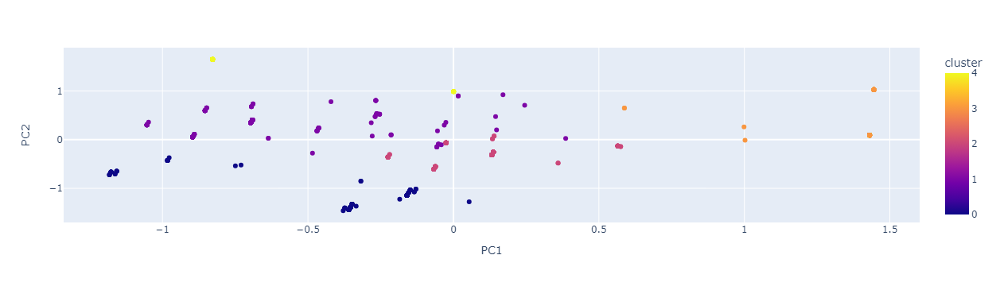

In [133]:
df_important_cols = df_minmax[[
    'has_bluetooth_True', 'has_webcam_True', 'keyboard_numpad_True', 'keyboard_backlit_True',
    'gpu_extra_manufacturer_None', 'gpu_extra_manufacturer_NVIDIA', 
    'cpu_processor_manufacturer_Intel', 'manufacturer_Apple', 
    'wifi_standard_Wi-Fi 6 (802.11ax)', 'wifi_standard_Wi-Fi 6E (802.11ax)', 
    'operating_system_macOS', 'operating_system_Windows',
    'gpu_extra_performance', 'cpu_performance'
]]



kmeans = KMeans(n_clusters=5, random_state=42)
clusters = kmeans.fit_predict(df_important_cols)
labels = kmeans.labels_

pca = PCA(n_components=3)
X_pca = pca.fit_transform(df_important_cols)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])
df_pca['cluster'] = labels

fig = px.scatter_3d(df_pca, x='PC1', y='PC2', z='PC3', color='cluster')
fig.show()

pca = PCA(n_components=2)
X_pca = pca.fit_transform(df_important_cols)

df_pca = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2'])
df_pca['cluster'] = labels

fig = px.scatter(df_pca, x='PC1', y='PC2', color='cluster')
fig.show()

#add_score(df_important_cols, 'Kmeans 4 clusters + important columns', clusters, df_score)

In [134]:
def plot_radar(data, labels, cluster):
    num_vars = len(labels)

    angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

    angles += angles[:1]

    fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
    values = data.tolist()
    values += values[:1]
    ax.plot(angles, values, linewidth=1, linestyle='solid', label=f'Cluster {cluster}')
    ax.fill(angles, values, alpha=0.25)

    ax.set_yticklabels([])
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(labels)

    ax.legend(loc='upper right', bbox_to_anchor=(1.1, 1.1))

    plt.title(f'Cluster {cluster} Radial Chart')
    plt.show()

In [135]:
def plot_pie(data, labels, cluster):
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.pie(data, labels=labels, autopct='%1.1f%%', startangle=90)
    ax.axis('equal')
    plt.title(f'Cluster {cluster} Distribution')
    plt.show()

In [136]:
def plot_feature_pie(data, feature, clusters, cluster_names):
    num_clusters = len(clusters)
    fig, axes = plt.subplots(1, num_clusters, figsize=(20, 5))
    
    for i, cluster in enumerate(clusters):
        cluster_data = data[data['cluster'] == cluster][feature]
        sizes = cluster_data.value_counts(normalize=True) * 100
        labels = sizes.index
        
        axes[i].pie(sizes, labels=labels, autopct='%1.1f%%', startangle=90)
        axes[i].axis('equal')
        axes[i].set_title(f'Cluster {cluster_names[cluster]}')
    
    plt.suptitle(f'{feature} Distribution Across Clusters')
    plt.show()

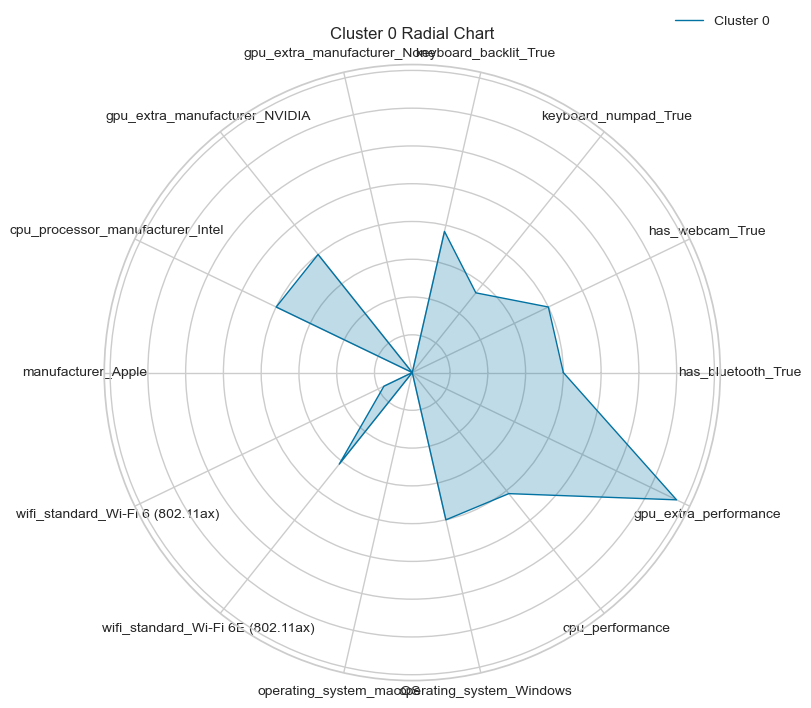

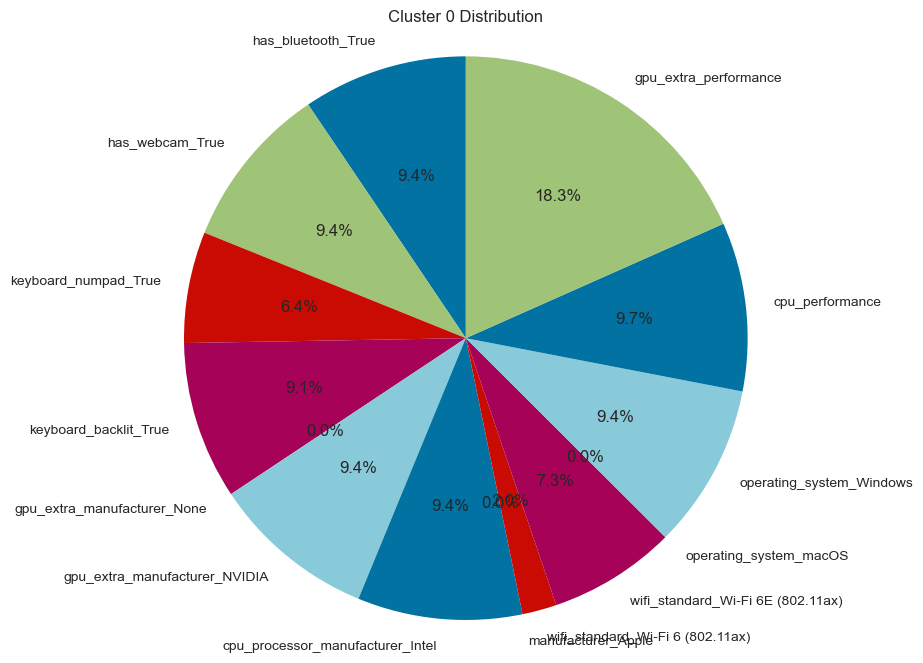

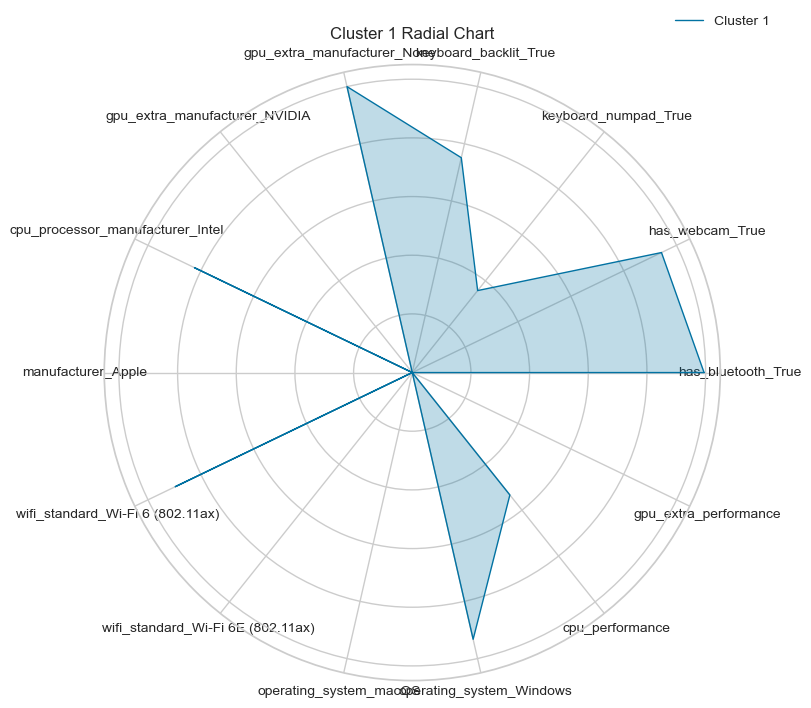

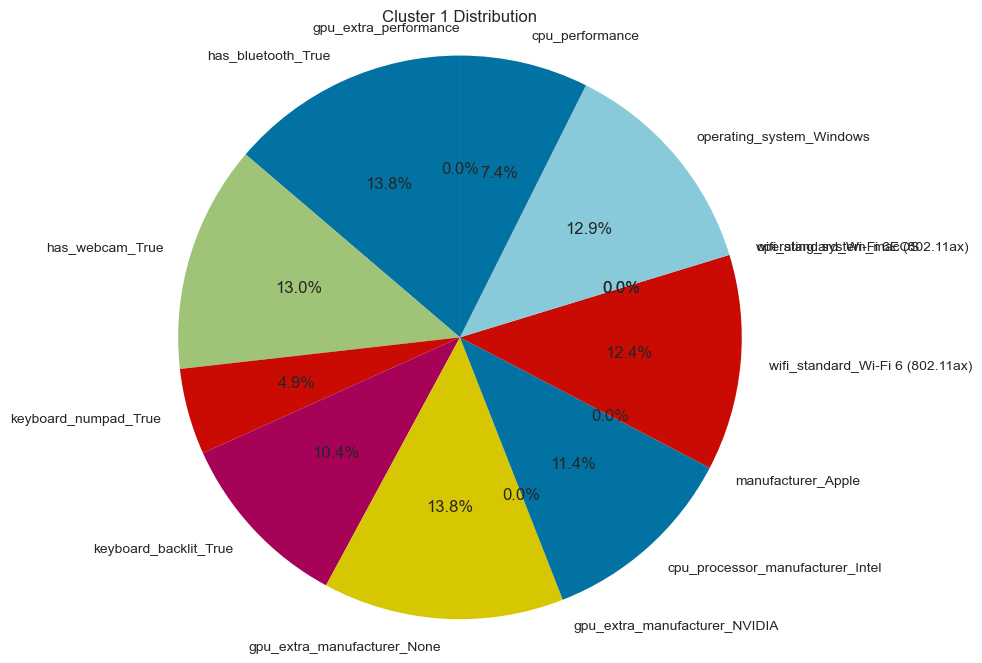

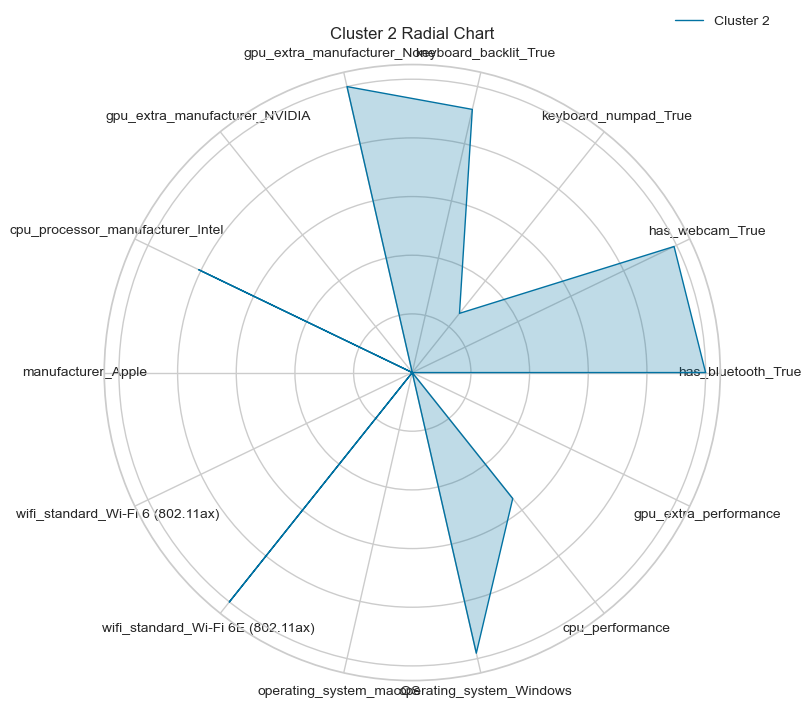

...

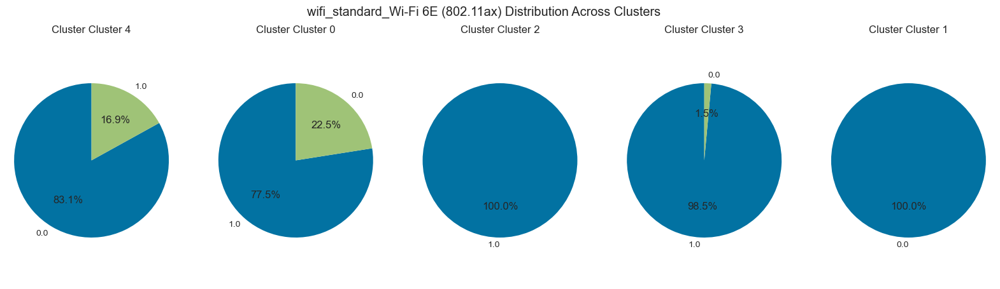

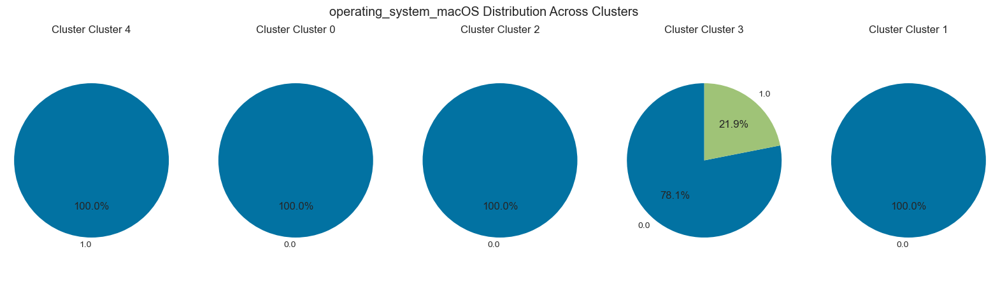

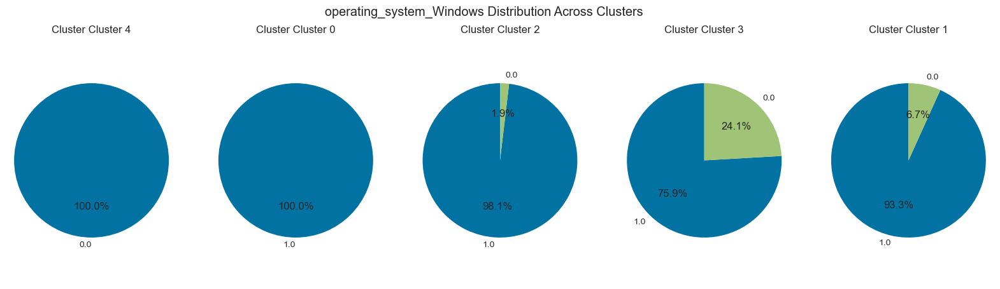

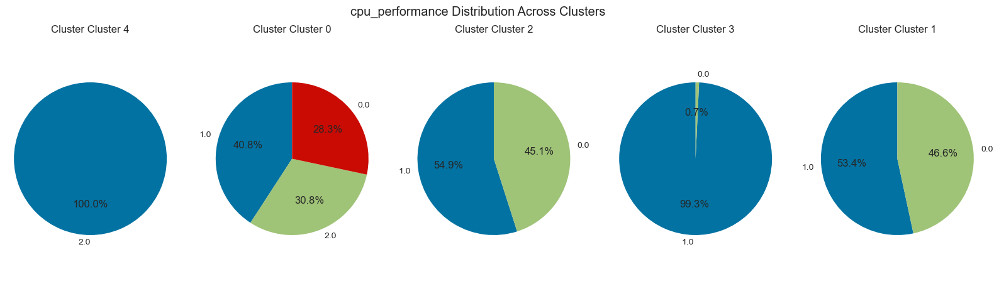

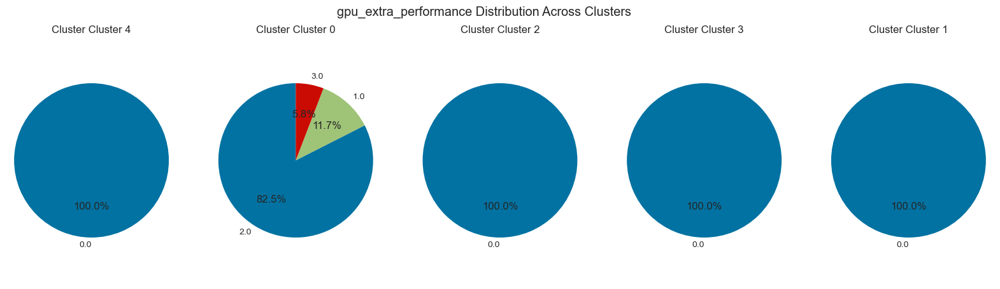

In [137]:
important_columns = [
    'has_bluetooth_True', 'has_webcam_True', 'keyboard_numpad_True', 'keyboard_backlit_True',
    'gpu_extra_manufacturer_None', 'gpu_extra_manufacturer_NVIDIA', 
    'cpu_processor_manufacturer_Intel',
    'manufacturer_Apple', 'wifi_standard_Wi-Fi 6 (802.11ax)', 'wifi_standard_Wi-Fi 6E (802.11ax)', 
    'operating_system_macOS', 'operating_system_Windows',  
    'cpu_performance', 'gpu_extra_performance'
]
df_important_cols = df_minmax[important_columns]

df_important_inverse_transformed = df_important_cols.copy()
for col in important_columns:
    df_important_inverse_transformed[col] = df_important_cols[col] * (scaler.data_max_[df_modified.columns.get_loc(col)] - scaler.data_min_[df_modified.columns.get_loc(col)]) + scaler.data_min_[df_modified.columns.get_loc(col)]

df_important_inverse_transformed['cluster'] = labels
cluster_means = df_important_inverse_transformed.groupby('cluster').mean()

cluster_means_transposed = cluster_means.T
cluster_means_transposed.reset_index(inplace=True)
cluster_means_transposed.rename(columns={'index': 'Feature'}, inplace=True)

features = cluster_means_transposed['Feature'].tolist()

for cluster in cluster_means.index:
    data = cluster_means.loc[cluster]
    plot_radar(data, features, cluster)
    plot_pie(data, features, cluster)
    #plot_box(data, cluster)
    
unique_clusters = df_important_inverse_transformed['cluster'].unique()
cluster_names = {i: f'Cluster {i}' for i in unique_clusters}
for feature in important_columns:
    plot_feature_pie(df_important_inverse_transformed, feature, unique_clusters, cluster_names)

In [138]:
for cluster in cluster_means.index:
    print(f"\nCluster {cluster} Analysis:")
    for feature in important_columns:
        mean_value = cluster_means.loc[cluster, feature]
        print(f"  {feature}: {mean_value:.2f}")



Cluster 0 Analysis:
  has_bluetooth_True: 1.00
  has_webcam_True: 1.00
  keyboard_numpad_True: 0.68
  keyboard_backlit_True: 0.96
  gpu_extra_manufacturer_None: 0.00
  gpu_extra_manufacturer_NVIDIA: 1.00
  cpu_processor_manufacturer_Intel: 1.00
  manufacturer_Apple: 0.00
  wifi_standard_Wi-Fi 6 (802.11ax): 0.21
  wifi_standard_Wi-Fi 6E (802.11ax): 0.78
  operating_system_macOS: 0.00
  operating_system_Windows: 1.00
  cpu_performance: 1.02
  gpu_extra_performance: 1.94

Cluster 1 Analysis:
  has_bluetooth_True: 0.99
  has_webcam_True: 0.94
  keyboard_numpad_True: 0.36
  keyboard_backlit_True: 0.75
  gpu_extra_manufacturer_None: 1.00
  gpu_extra_manufacturer_NVIDIA: 0.00
  cpu_processor_manufacturer_Intel: 0.82
  manufacturer_Apple: 0.00
  wifi_standard_Wi-Fi 6 (802.11ax): 0.90
  wifi_standard_Wi-Fi 6E (802.11ax): 0.00
  operating_system_macOS: 0.00
  operating_system_Windows: 0.93
  cpu_performance: 0.53
  gpu_extra_performance: 0.00

Cluster 2 Analysis:
  has_bluetooth_True: 1.00
  ha

### Cluster 0
High-performance gpus and good cpus, intel processors with nvidia gpus,wifi_standard_Wi-Fi 6E mostly, could maybe put them next to premium keyboards and mouses, and other peripherals , or maybe offer them together with a discount (do we even have those or are we laptop-only shop???)

### Cluster 1
Moderate-performance cpus, also windows, wifi_standard_Wi-Fi 6 (802.11ax), not a lot of laptopts have numpad, no extra gpu, just the integrated one

### Cluster 2
Also Moderate-performance cpus, also windows, wifi_standard_Wi-Fi 6E (802.11ax), on all devices, webcam and numpad on almost all computers, some of them medium, other low cpu performance

### Cluster 3
Our modest selection of apple 'budget' products as well as windows, all have pretty good cpu performance, no extra gpu, all intel cpus, wifi_standard_Wi-Fi 6E (802.11ax), low presence of wifi_standard_Wi-Fi 6 (802.11ax)

### Cluster 4 
Premium Apple products, good cpu performance, bad gpu performance, not recommended for gamers, could recommend them to professionals (has both webcam and bluetooth, issue is most other clusters do not have such a good cpu performance, so their only option is deciding on an apple device), also pair them up with other apple products/accessories if we have them 